In [1]:
from __future__ import annotations

import json
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from IPython.display import display

CATEGORY_FILTER = None  # e.g. {'linguistic_style', 'ideology'}
PAIR_FILTER = None  # e.g. {'linguistic_style__concise__verbose'}

In [2]:
def layer_index_map(layers: list[int]) -> dict[int, int]:
    """Map stored zero-based layer ids to plot order: 1 = layer 0, max = last layer."""
    return {layer: idx for idx, layer in enumerate(sorted(layers), start=1)}

def load_layer_matrix(pair_dir: Path, variant: str, layer: int) -> np.ndarray:
    layer_path = pair_dir / variant / f'layer_{layer}.npy'
    return np.load(layer_path)

## Combined Concept Projection

Project `negpos` and `posneg` last-token hidden states onto `base_to_pos` and `base_to_neg` concept vectors, then compare whether both concepts are present or one dominates.



In [3]:
# Projection of combined-concept hidden states onto the two contrastive concept vectors

MODEL_NAME = 'Llama-3.2-3B-Instruct'
COMBINED_HIDDEN_ROOT = Path('/Users/xinmingwang/Downloads/hidden_states_negpos_posneg') / MODEL_NAME
STEERING_VECTOR_ROOT = Path('contrastive_hidden_states/data/steering_vectors') / MODEL_NAME
COMBINED_VARIANTS = ('negpos', 'posneg')

assert COMBINED_HIDDEN_ROOT.exists(), f'Combined hidden-state root not found: {COMBINED_HIDDEN_ROOT}'
assert STEERING_VECTOR_ROOT.exists(), f'Steering vector root not found: {STEERING_VECTOR_ROOT}'

COMBINED_HIDDEN_ROOT, STEERING_VECTOR_ROOT



(PosixPath('/Users/xinmingwang/Downloads/hidden_states_negpos_posneg/Llama-3.2-3B-Instruct'),
 PosixPath('contrastive_hidden_states/data/steering_vectors/Llama-3.2-3B-Instruct'))

In [4]:
def unit_vector(v: np.ndarray) -> np.ndarray:
    norm = np.linalg.norm(v)
    if norm == 0:
        return np.full_like(v, np.nan, dtype=np.float64)
    return v / norm


def rowwise_cosine(matrix: np.ndarray, vector: np.ndarray) -> np.ndarray:
    vector_norm = np.linalg.norm(vector)
    matrix_norms = np.linalg.norm(matrix, axis=1)
    denom = matrix_norms * vector_norm
    out = np.full(matrix.shape[0], np.nan, dtype=np.float64)
    mask = denom != 0
    out[mask] = matrix[mask] @ vector / denom[mask]
    return out


def iter_combined_pair_infos(hidden_root: Path):
    for category_dir in sorted(path for path in hidden_root.iterdir() if path.is_dir()):
        if CATEGORY_FILTER and category_dir.name not in CATEGORY_FILTER:
            continue
        for pair_dir in sorted(path for path in category_dir.iterdir() if path.is_dir()):
            if PAIR_FILTER and pair_dir.name not in PAIR_FILTER:
                continue
            metadata_path = pair_dir / 'metadata.json'
            if not metadata_path.exists():
                continue
            metadata = json.loads(metadata_path.read_text(encoding='utf-8'))
            examples = metadata.get('examples', [])
            first_example = examples[0] if examples else {}
            layers = metadata['run_config']['hidden_layers']
            available_variants = set(metadata.get('variant_counts', {}))
            yield {
                'pair_dir': pair_dir,
                'category_key': first_example.get('category_key', category_dir.name),
                'category_name': first_example.get('category_name', category_dir.name),
                'pair_slug': first_example.get('pair_slug', pair_dir.name),
                'positive_concept': first_example.get('positive_concept', ''),
                'negative_concept': first_example.get('negative_concept', ''),
                'layers': layers,
                'available_variants': available_variants,
                'variant_counts': metadata.get('variant_counts', {}),
            }


def load_concept_vectors(vector_root: Path, category_key: str, pair_slug: str) -> tuple[np.ndarray, np.ndarray]:
    pair_vector_dir = vector_root / category_key / pair_slug
    pos_path = pair_vector_dir / 'base_to_pos.npy'
    neg_path = pair_vector_dir / 'base_to_neg.npy'
    if not pos_path.exists() or not neg_path.exists():
        raise FileNotFoundError(f'Missing base_to_pos/base_to_neg vectors under {pair_vector_dir}')
    return np.load(pos_path), np.load(neg_path)


def build_combined_projection_results(
    hidden_root: Path,
    vector_root: Path,
    variants: tuple[str, ...] = COMBINED_VARIANTS,
) -> pd.DataFrame:
    rows = []

    for pair_info in iter_combined_pair_infos(hidden_root):
        pair_dir = pair_info['pair_dir']
        pair_slug = pair_info['pair_slug']
        category_key = pair_info['category_key']
        layer_to_index = layer_index_map(pair_info['layers'])
        base_to_pos, base_to_neg = load_concept_vectors(vector_root, category_key, pair_slug)

        for variant in variants:
            if variant not in pair_info['available_variants']:
                continue

            for layer in sorted(pair_info['layers']):
                hidden = load_layer_matrix(pair_dir, variant, layer).astype(np.float64)
                pos_vec = base_to_pos[layer].astype(np.float64)
                neg_vec = base_to_neg[layer].astype(np.float64)
                pos_unit = unit_vector(pos_vec)
                neg_unit = unit_vector(neg_vec)

                pos_projection = hidden @ pos_unit
                neg_projection = hidden @ neg_unit
                pos_cosine = rowwise_cosine(hidden, pos_vec)
                neg_cosine = rowwise_cosine(hidden, neg_vec)

                rows.append({
                    'category_key': category_key,
                    'category_name': pair_info['category_name'],
                    'pair_slug': pair_slug,
                    'concept_label': f"{pair_info['positive_concept']} vs {pair_info['negative_concept']}",
                    'positive_concept': pair_info['positive_concept'],
                    'negative_concept': pair_info['negative_concept'],
                    'variant': variant,
                    'layer': layer,
                    'layer_index': layer_to_index[layer],
                    'n_examples': hidden.shape[0],
                    'hidden_dim': hidden.shape[1],
                    'mean_pos_projection': float(np.nanmean(pos_projection)),
                    'mean_neg_projection': float(np.nanmean(neg_projection)),
                    'mean_projection_dominance_pos_minus_neg': float(np.nanmean(pos_projection - neg_projection)),
                    'mean_abs_projection_gap': float(np.nanmean(np.abs(pos_projection - neg_projection))),
                    'mean_min_projection': float(np.nanmean(np.minimum(pos_projection, neg_projection))),
                    'mean_pos_cosine': float(np.nanmean(pos_cosine)),
                    'mean_neg_cosine': float(np.nanmean(neg_cosine)),
                    'mean_cosine_dominance_pos_minus_neg': float(np.nanmean(pos_cosine - neg_cosine)),
                    'frac_pos_projection_dominates': float(np.nanmean(pos_projection > neg_projection)),
                    'frac_neg_projection_dominates': float(np.nanmean(neg_projection > pos_projection)),
                    'pos_vector_norm': float(np.linalg.norm(pos_vec)),
                    'neg_vector_norm': float(np.linalg.norm(neg_vec)),
                    'mean_hidden_norm': float(np.nanmean(np.linalg.norm(hidden, axis=1))),
                })

    df = pd.DataFrame(rows)
    if df.empty:
        raise ValueError(
            f'No combined projection rows found. Check hidden root {hidden_root} and variants {variants}.'
        )
    return df.sort_values(['layer_index', 'category_key', 'pair_slug', 'variant']).reset_index(drop=True)


combined_projection_df = build_combined_projection_results(COMBINED_HIDDEN_ROOT, STEERING_VECTOR_ROOT)

print(
    f"Loaded {combined_projection_df['pair_slug'].nunique()} pairs, "
    f"{combined_projection_df['variant'].nunique()} variants, "
    f"{combined_projection_df['layer_index'].nunique()} layers"
)
display(combined_projection_df.head())



Loaded 150 pairs, 2 variants, 28 layers


,category_key,category_name,pair_slug,concept_label,positive_concept,negative_concept,variant,layer,layer_index,n_examples,...,mean_abs_projection_gap,mean_min_projection,mean_pos_cosine,mean_neg_cosine,mean_cosine_dominance_pos_minus_neg,frac_pos_projection_dominates,frac_neg_projection_dominates,pos_vector_norm,neg_vector_norm,mean_hidden_norm
0,ideology,IDEOLOGY,ideology__centralization_support__decentraliza...,centralization-support vs decentralization-sup...,centralization-support,decentralization-support,negpos,0,1,100,...,0.039731,-0.148843,-0.057661,-0.078662,0.021001,1.0,0.0,0.148414,0.130441,1.892202
1,ideology,IDEOLOGY,ideology__centralization_support__decentraliza...,centralization-support vs decentralization-sup...,centralization-support,decentralization-support,posneg,0,1,100,...,0.039598,-0.148222,-0.057403,-0.078333,0.020930,1.0,0.0,0.148414,0.130441,1.892232
2,ideology,IDEOLOGY,ideology__collective_benefit__personal_benefit,collective-benefit vs personal-benefit,collective-benefit,personal-benefit,negpos,0,1,100,...,0.034718,-0.163043,-0.067808,-0.086156,0.018348,1.0,0.0,0.143173,0.124157,1.892410
3,ideology,IDEOLOGY,ideology__collective_benefit__personal_benefit,collective-benefit vs personal-benefit,collective-benefit,personal-benefit,posneg,0,1,100,...,0.034151,-0.162797,-0.067974,-0.086023,0.018048,1.0,0.0,0.143173,0.124157,1.892484
4,ideology,IDEOLOGY,ideology__collective_responsibility__individua...,collective-responsibility vs individual-respon...,collective-responsibility,individual-responsibility,negpos,0,1,100,...,0.034760,-0.142751,-0.056921,-0.075244,0.018323,1.0,0.0,0.139097,0.116260,1.897197


In [5]:
combined_layer_summary = (
    combined_projection_df
    .groupby(['variant', 'layer_index'], as_index=False)
    .agg(
        mean_pos_projection=('mean_pos_projection', 'mean'),
        mean_neg_projection=('mean_neg_projection', 'mean'),
        mean_projection_dominance_pos_minus_neg=('mean_projection_dominance_pos_minus_neg', 'mean'),
        mean_abs_projection_gap=('mean_abs_projection_gap', 'mean'),
        mean_min_projection=('mean_min_projection', 'mean'),
        mean_pos_cosine=('mean_pos_cosine', 'mean'),
        mean_neg_cosine=('mean_neg_cosine', 'mean'),
        mean_cosine_dominance_pos_minus_neg=('mean_cosine_dominance_pos_minus_neg', 'mean'),
        mean_frac_pos_projection_dominates=('frac_pos_projection_dominates', 'mean'),
        mean_frac_neg_projection_dominates=('frac_neg_projection_dominates', 'mean'),
        num_pairs=('pair_slug', 'nunique'),
    )
    .sort_values(['variant', 'layer_index'])
)

display(combined_layer_summary)

display(
    combined_projection_df[[
        'category_key',
        'concept_label',
        'variant',
        'layer_index',
        'mean_pos_projection',
        'mean_neg_projection',
        'mean_projection_dominance_pos_minus_neg',
        'mean_pos_cosine',
        'mean_neg_cosine',
        'mean_cosine_dominance_pos_minus_neg',
        'frac_pos_projection_dominates',
        'frac_neg_projection_dominates',
    ]].head(50)
)



,variant,layer_index,mean_pos_projection,mean_neg_projection,mean_projection_dominance_pos_minus_neg,mean_abs_projection_gap,mean_min_projection,mean_pos_cosine,mean_neg_cosine,mean_cosine_dominance_pos_minus_neg,mean_frac_pos_projection_dominates,mean_frac_neg_projection_dominates,num_pairs
0,negpos,1,-0.051240,-0.089958,0.038718,0.052184,-0.096691,-0.027135,-0.047617,0.020483,0.782000,0.218000,150
1,negpos,2,-0.155163,-0.149848,-0.005316,0.037561,-0.171286,-0.069916,-0.067568,-0.002349,0.533667,0.466333,150
2,negpos,3,-0.192060,-0.137585,-0.054475,0.057514,-0.193580,-0.074474,-0.053388,-0.021086,0.094067,0.905933,150
3,negpos,4,0.176114,0.212327,-0.036212,0.062404,0.163019,0.054582,0.065782,-0.011200,0.291333,0.708667,150
4,negpos,5,0.282567,0.552666,-0.270099,0.272100,0.281566,0.066319,0.131971,-0.065652,0.017800,0.982200,150
5,negpos,6,0.016665,0.033741,-0.017076,0.104869,-0.027231,0.003079,0.006639,-0.003559,0.448400,0.551600,150
6,negpos,7,0.630922,0.853860,-0.222938,0.249539,0.617622,0.117586,0.160448,-0.042862,0.104067,0.895933,150
7,negpos,8,0.766424,1.103910,-0.337486,0.356521,0.756906,0.127393,0.184409,-0.057016,0.067733,0.932267,150
8,negpos,9,0.884895,1.060517,-0.175623,0.278113,0.833650,0.134605,0.161005,-0.026399,0.259800,0.740200,150
9,negpos,10,1.808056,2.118330,-0.310274,0.401123,1.762632,0.238377,0.280673,-0.042297,0.209467,0.790533,150


,category_key,concept_label,variant,layer_index,mean_pos_projection,mean_neg_projection,mean_projection_dominance_pos_minus_neg,mean_pos_cosine,mean_neg_cosine,mean_cosine_dominance_pos_minus_neg,frac_pos_projection_dominates,frac_neg_projection_dominates
0,ideology,centralization-support vs decentralization-sup...,negpos,1,-0.109112,-0.148843,0.039731,-0.057661,-0.078662,0.021001,1.00,0.00
1,ideology,centralization-support vs decentralization-sup...,posneg,1,-0.108625,-0.148222,0.039598,-0.057403,-0.078333,0.020930,1.00,0.00
2,ideology,collective-benefit vs personal-benefit,negpos,1,-0.128325,-0.163043,0.034718,-0.067808,-0.086156,0.018348,1.00,0.00
3,ideology,collective-benefit vs personal-benefit,posneg,1,-0.128646,-0.162797,0.034151,-0.067974,-0.086023,0.018048,1.00,0.00
4,ideology,collective-responsibility vs individual-respon...,negpos,1,-0.107991,-0.142751,0.034760,-0.056921,-0.075244,0.018323,1.00,0.00
5,ideology,collective-responsibility vs individual-respon...,posneg,1,-0.108345,-0.142952,0.034607,-0.057104,-0.075346,0.018242,1.00,0.00
6,ideology,collective-security vs civil-liberty,negpos,1,-0.136983,-0.043863,-0.093120,-0.072369,-0.023173,-0.049196,0.00,1.00
7,ideology,collective-security vs civil-liberty,posneg,1,-0.138121,-0.043205,-0.094916,-0.072952,-0.022820,-0.050132,0.00,1.00
8,ideology,collective-welfare vs individual-liberty,negpos,1,-0.099603,-0.072106,-0.027496,-0.052518,-0.038022,-0.014496,0.00,1.00
9,ideology,collective-welfare vs individual-liberty,posneg,1,-0.101482,-0.070920,-0.030562,-0.053501,-0.037390,-0.016110,0.00,1.00


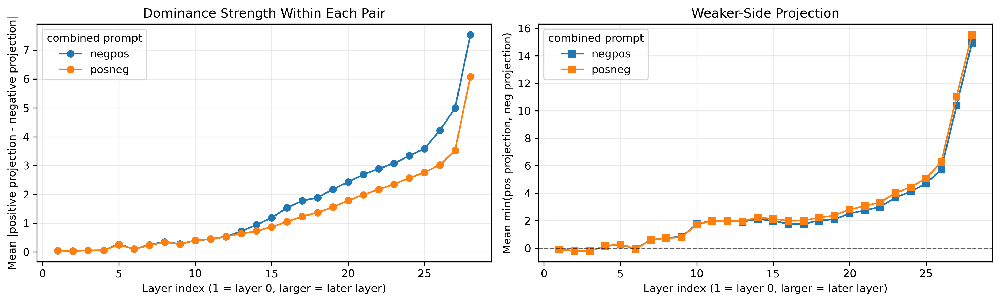

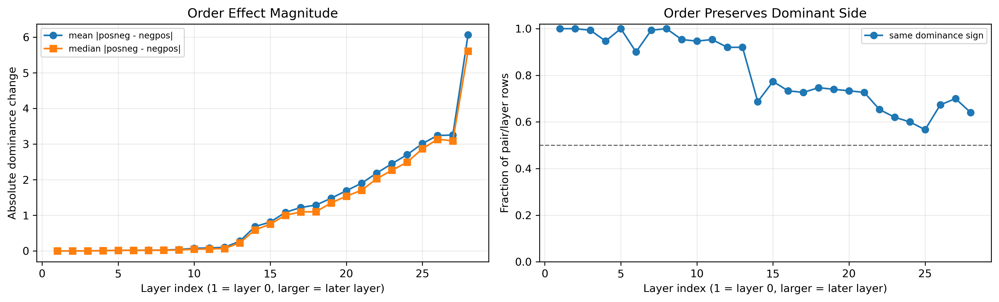

,layer_index,mean_abs_order_effect,median_abs_order_effect,mean_relative_order_effect,same_dominance_sign_fraction,mean_abs_dominance
0,1,0.000872,0.000463,0.045400,1.000000,0.051685
1,2,0.000681,0.000391,0.042772,1.000000,0.037112
2,3,0.002078,0.001904,0.090842,0.993333,0.056301
3,4,0.009158,0.008145,0.353029,0.946667,0.057834
4,5,0.019318,0.018361,0.090541,1.000000,0.261137


In [7]:
# More interpretable aggregate plots.
# We avoid averaging raw positive/negative projections across pairs because
# "positive" and "negative" are pair-local labels, not universal semantic axes.

fig, axes = plt.subplots(1, 2, figsize=(13, 4), dpi=300, sharex=True)

for variant, variant_df in combined_layer_summary.groupby('variant'):
    variant_df = variant_df.sort_values('layer_index')
    axes[0].plot(
        variant_df['layer_index'],
        variant_df['mean_abs_projection_gap'],
        marker='o',
        label=variant,
    )
    axes[1].plot(
        variant_df['layer_index'],
        variant_df['mean_min_projection'],
        marker='s',
        label=variant,
    )

axes[0].set_title('Dominance Strength Within Each Pair')
axes[0].set_xlabel('Layer index (1 = layer 0, larger = later layer)')
axes[0].set_ylabel('Mean |positive projection - negative projection|')
axes[0].grid(alpha=0.25)
axes[0].legend(title='combined prompt')

axes[1].axhline(0.0, color='black', linewidth=1, linestyle='--', alpha=0.6)
axes[1].set_title('Weaker-Side Projection')
axes[1].set_xlabel('Layer index (1 = layer 0, larger = later layer)')
axes[1].set_ylabel('Mean min(pos projection, neg projection)')
axes[1].grid(alpha=0.25)
axes[1].legend(title='combined prompt')

plt.tight_layout()
plt.show()

# Direct order-effect summary: compare posneg and negpos within the same pair/layer.
order_key_cols = ['category_key', 'pair_slug', 'concept_label', 'layer_index']
order_wide = (
    combined_projection_df
    .pivot_table(
        index=order_key_cols,
        columns='variant',
        values='mean_projection_dominance_pos_minus_neg',
        aggfunc='mean',
    )
    .reset_index()
)
order_wide['order_effect_posneg_minus_negpos'] = order_wide['posneg'] - order_wide['negpos']
order_wide['abs_order_effect'] = order_wide['order_effect_posneg_minus_negpos'].abs()
order_wide['mean_abs_dominance'] = (order_wide['posneg'].abs() + order_wide['negpos'].abs()) / 2.0
order_wide['relative_order_effect'] = order_wide['abs_order_effect'] / order_wide['mean_abs_dominance'].replace(0, np.nan)
order_wide['same_dominance_sign'] = np.sign(order_wide['posneg']) == np.sign(order_wide['negpos'])

order_layer_summary = (
    order_wide
    .groupby('layer_index', as_index=False)
    .agg(
        mean_abs_order_effect=('abs_order_effect', 'mean'),
        median_abs_order_effect=('abs_order_effect', 'median'),
        mean_relative_order_effect=('relative_order_effect', 'mean'),
        same_dominance_sign_fraction=('same_dominance_sign', 'mean'),
        mean_abs_dominance=('mean_abs_dominance', 'mean'),
    )
)

fig, axes = plt.subplots(1, 2, figsize=(13, 4), dpi=300, sharex=True)
axes[0].plot(
    order_layer_summary['layer_index'],
    order_layer_summary['mean_abs_order_effect'],
    marker='o',
    label='mean |posneg - negpos|',
)
axes[0].plot(
    order_layer_summary['layer_index'],
    order_layer_summary['median_abs_order_effect'],
    marker='s',
    label='median |posneg - negpos|',
)
axes[0].set_title('Order Effect Magnitude')
axes[0].set_xlabel('Layer index (1 = layer 0, larger = later layer)')
axes[0].set_ylabel('Absolute dominance change')
axes[0].grid(alpha=0.25)
axes[0].legend(fontsize=8)

axes[1].plot(
    order_layer_summary['layer_index'],
    order_layer_summary['same_dominance_sign_fraction'],
    marker='o',
    label='same dominance sign',
)
axes[1].axhline(0.5, color='black', linewidth=1, linestyle='--', alpha=0.6)
axes[1].set_ylim(0, 1.02)
axes[1].set_title('Order Preserves Dominant Side')
axes[1].set_xlabel('Layer index (1 = layer 0, larger = later layer)')
axes[1].set_ylabel('Fraction of pair/layer rows')
axes[1].grid(alpha=0.25)
axes[1].legend(fontsize=8)

plt.tight_layout()
plt.show()

display(order_layer_summary.head())



In [8]:
def plot_combined_projection_heatmap(
    df: pd.DataFrame,
    variant: str,
    value_col: str = 'mean_projection_dominance_pos_minus_neg',
    category_key: str | None = None,
    figsize=(14, 18),
):
    subset = df.loc[df['variant'] == variant].copy()
    if category_key is not None:
        subset = subset.loc[subset['category_key'] == category_key]
    if subset.empty:
        raise ValueError(f'No rows for variant={variant!r}, category_key={category_key!r}')

    heatmap_df = subset.pivot(index='concept_label', columns='layer_index', values=value_col)
    heatmap_df = heatmap_df.reindex(sorted(heatmap_df.columns), axis=1)

    max_abs = np.nanmax(np.abs(heatmap_df.to_numpy()))
    vmax = max_abs if max_abs > 0 else 1.0

    fig, ax = plt.subplots(figsize=figsize, dpi=300)
    im = ax.imshow(
        heatmap_df.to_numpy(),
        aspect='auto',
        cmap='coolwarm',
        vmin=-vmax,
        vmax=vmax,
    )
    ax.set_xticks(range(len(heatmap_df.columns)))
    ax.set_xticklabels(heatmap_df.columns)
    ax.set_yticks(range(len(heatmap_df.index)))
    ax.set_yticklabels(heatmap_df.index)
    ax.set_xlabel('Layer index (1 = layer 0, larger = later layer)')
    ax.set_ylabel('Concept pair')
    title_suffix = '' if category_key is None else f' ({category_key})'
    ax.set_title(f'{variant}: positive projection - negative projection{title_suffix}')
    cbar = fig.colorbar(im, ax=ax, shrink=0.8)
    cbar.set_label(value_col)
    plt.tight_layout()
    return heatmap_df


heatmap_tables = {}
for variant in COMBINED_VARIANTS:
    heatmap_tables[variant] = plot_combined_projection_heatmap(
        combined_projection_df,
        variant=variant,
        value_col='mean_projection_dominance_pos_minus_neg',
        figsize=(14, max(6, 0.28 * combined_projection_df['pair_slug'].nunique())),
    )
    plt.show()

# Optional category-specific heatmap example:
# plot_combined_projection_heatmap(combined_projection_df, variant='negpos', category_key='ideology')



In [9]:
combined_output_dir = Path('contrast_sanity_outputs')
combined_output_dir.mkdir(exist_ok=True)

combined_projection_df.to_csv(combined_output_dir / 'combined_concept_projection_all_llama.csv', index=False)
combined_layer_summary.to_csv(combined_output_dir / 'combined_concept_projection_layer_summary_llama.csv', index=False)

print(f'Saved combined-concept projection outputs to: {combined_output_dir.resolve()}')



Saved combined-concept projection outputs to: /Users/xinmingwang/Library/CloudStorage/OneDrive-NationalUniversityofSingapore/Wisc/contrast_sanity_outputs


## All-Category Order Comparison From CSV

Read the saved combined projection CSV and draw all-category `negpos` vs `posneg` heatmaps with a shared color scale, plus an order-effect heatmap.



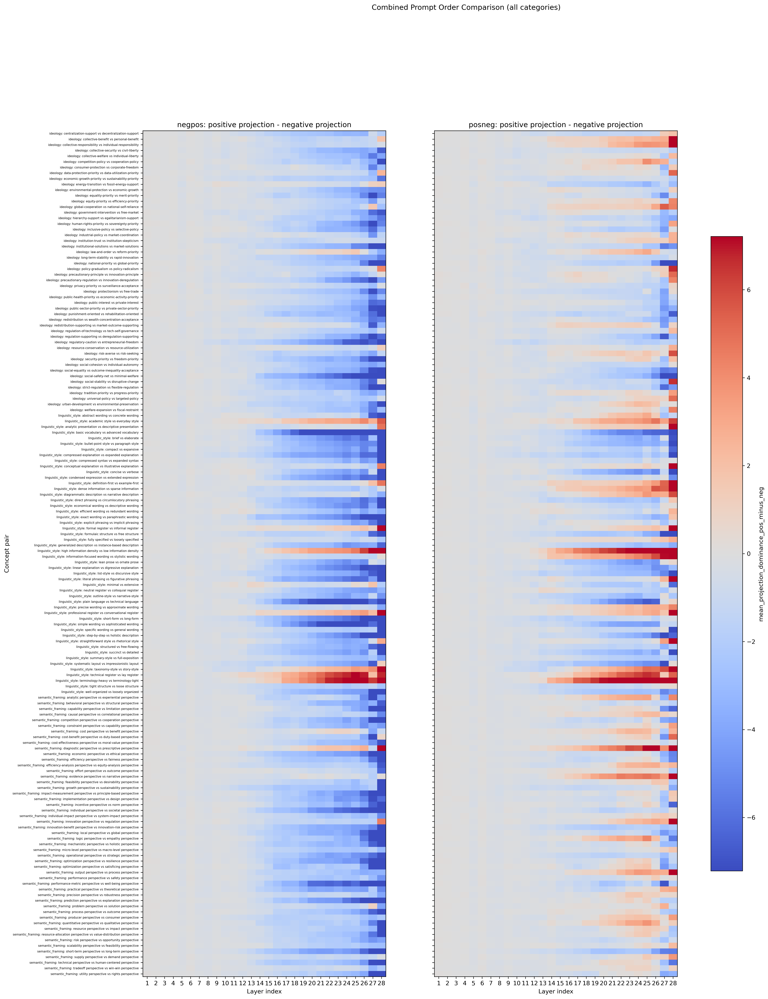

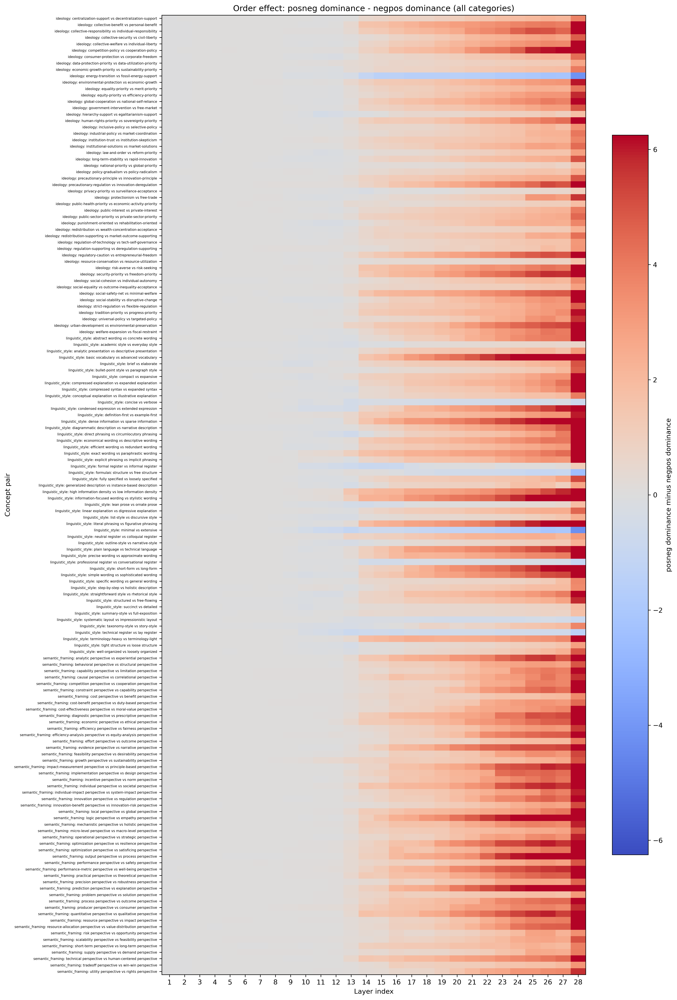

Saved comparison heatmap to: contrast_sanity_outputs/plots/combined_projection_heatmap_negpos_vs_posneg_all_categories_llama.png
Saved order-effect heatmap to: contrast_sanity_outputs/plots/combined_projection_heatmap_order_effect_posneg_minus_negpos_all_categories_llama.png


In [6]:
CSV_OUTPUT_DIR = Path('contrast_sanity_outputs')
PLOT_OUTPUT_DIR = CSV_OUTPUT_DIR / 'plots'
PLOT_OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

combined_projection_all_csv = CSV_OUTPUT_DIR / 'combined_concept_projection_all_llama.csv'
combined_projection_all_df = pd.read_csv(combined_projection_all_csv)

ORDER_COMPARISON_VALUE_COL = 'mean_projection_dominance_pos_minus_neg'


def pivot_order_variant_from_csv(
    df: pd.DataFrame,
    variant: str,
    value_col: str = ORDER_COMPARISON_VALUE_COL,
) -> pd.DataFrame:
    subset = df.loc[df['variant'] == variant].copy()
    subset = subset.sort_values(['category_key', 'concept_label', 'layer_index'])
    pivot = subset.pivot_table(
        index=['category_key', 'concept_label'],
        columns='layer_index',
        values=value_col,
        aggfunc='mean',
    )
    return pivot.reindex(sorted(pivot.columns), axis=1)


def plot_all_category_negpos_vs_posneg_from_csv(
    df: pd.DataFrame,
    value_col: str = ORDER_COMPARISON_VALUE_COL,
    output_dir: Path = PLOT_OUTPUT_DIR,
):
    negpos = pivot_order_variant_from_csv(df, 'negpos', value_col=value_col)
    posneg = pivot_order_variant_from_csv(df, 'posneg', value_col=value_col)

    common_index = negpos.index.intersection(posneg.index)
    common_cols = negpos.columns.intersection(posneg.columns)
    negpos = negpos.loc[common_index, common_cols]
    posneg = posneg.loc[common_index, common_cols]

    labels = [f'{category}: {concept}' for category, concept in common_index]
    values = np.concatenate([negpos.to_numpy().ravel(), posneg.to_numpy().ravel()])
    vmax = np.nanpercentile(np.abs(values), 98)
    if not np.isfinite(vmax) or vmax == 0:
        vmax = np.nanmax(np.abs(values))
    if not np.isfinite(vmax) or vmax == 0:
        vmax = 1.0

    height = max(8, 0.17 * len(labels))
    fig, axes = plt.subplots(1, 2, figsize=(20, height), dpi=300, sharey=True)

    for ax, variant, table in zip(axes, ['negpos', 'posneg'], [negpos, posneg]):
        im = ax.imshow(table.to_numpy(), aspect='auto', cmap='coolwarm', vmin=-vmax, vmax=vmax)
        ax.set_xticks(range(len(table.columns)))
        ax.set_xticklabels(table.columns)
        ax.set_xlabel('Layer index')
        ax.set_title(f'{variant}: positive projection - negative projection')

    axes[0].set_yticks(range(len(labels)))
    axes[0].set_yticklabels(labels, fontsize=5)
    axes[0].set_ylabel('Concept pair')
    fig.colorbar(im, ax=axes, shrink=0.75, label=value_col)
    fig.suptitle('Combined Prompt Order Comparison (all categories)', y=0.995)

    output_path = output_dir / 'combined_projection_heatmap_negpos_vs_posneg_all_categories_llama.png'
    fig.savefig(output_path, bbox_inches='tight')
    plt.show()
    return output_path, negpos, posneg


def plot_all_category_order_effect_from_csv(
    negpos: pd.DataFrame,
    posneg: pd.DataFrame,
    output_dir: Path = PLOT_OUTPUT_DIR,
):
    diff = posneg - negpos
    labels = [f'{category}: {concept}' for category, concept in diff.index]
    values = diff.to_numpy()
    vmax = np.nanpercentile(np.abs(values), 98)
    if not np.isfinite(vmax) or vmax == 0:
        vmax = np.nanmax(np.abs(values))
    if not np.isfinite(vmax) or vmax == 0:
        vmax = 1.0

    height = max(8, 0.17 * len(labels))
    fig, ax = plt.subplots(figsize=(14, height), dpi=300)
    im = ax.imshow(values, aspect='auto', cmap='coolwarm', vmin=-vmax, vmax=vmax)
    ax.set_xticks(range(len(diff.columns)))
    ax.set_xticklabels(diff.columns)
    ax.set_yticks(range(len(labels)))
    ax.set_yticklabels(labels, fontsize=5)
    ax.set_xlabel('Layer index')
    ax.set_ylabel('Concept pair')
    ax.set_title('Order effect: posneg dominance - negpos dominance (all categories)')
    cbar = fig.colorbar(im, ax=ax, shrink=0.75)
    cbar.set_label('posneg dominance minus negpos dominance')

    output_path = output_dir / 'combined_projection_heatmap_order_effect_posneg_minus_negpos_all_categories_llama.png'
    fig.savefig(output_path, bbox_inches='tight')
    plt.show()
    return output_path, diff


comparison_path, negpos_table, posneg_table = plot_all_category_negpos_vs_posneg_from_csv(
    combined_projection_all_df
)
order_effect_path, order_effect_table = plot_all_category_order_effect_from_csv(
    negpos_table,
    posneg_table,
)

print(f'Saved comparison heatmap to: {comparison_path}')
print(f'Saved order-effect heatmap to: {order_effect_path}')



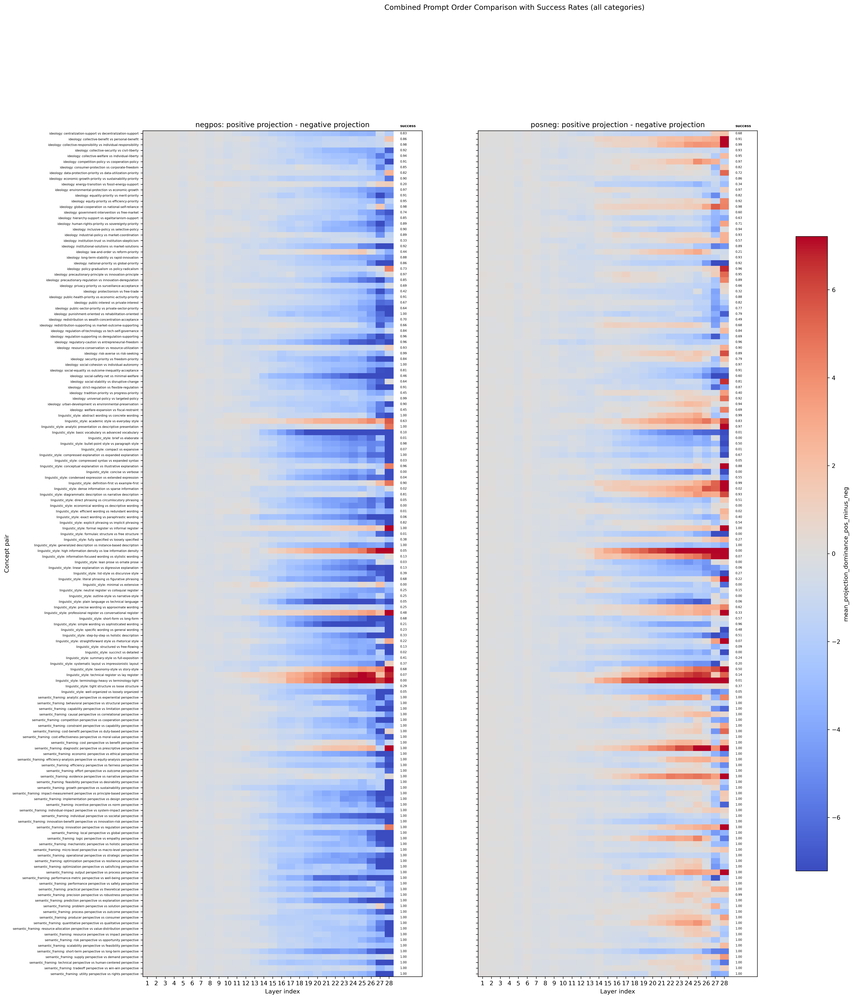

Saved comparison heatmap with success rates to: contrast_sanity_outputs/plots/combined_projection_heatmap_negpos_vs_posneg_with_success_rates_llama.png


In [8]:
CSV_OUTPUT_DIR = Path('contrast_sanity_outputs')
PLOT_OUTPUT_DIR = CSV_OUTPUT_DIR / 'plots'
PLOT_OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

combined_projection_all_csv = CSV_OUTPUT_DIR / 'combined_concept_projection_all_llama.csv'
combined_projection_all_df = pd.read_csv(combined_projection_all_csv)

JUDGEMENT_DIR = Path('outputs/vllm_google_gemma-3-27b-it_judgements_combined_full_Llama-3.2-3B-Instruct')
JUDGEMENT_JSONL = JUDGEMENT_DIR / 'judgements.jsonl'

ORDER_COMPARISON_VALUE_COL = 'mean_projection_dominance_pos_minus_neg'


def load_pair_order_success_rates(judgement_jsonl: Path) -> pd.DataFrame:
    rows = []
    with judgement_jsonl.open('r', encoding='utf-8') as f:
        for line in f:
            if line.strip():
                rows.append(json.loads(line))

    df = pd.DataFrame(rows)
    if df.empty:
        raise ValueError(f'No judgement rows found in {judgement_jsonl}')

    order_col = 'combined_order' if 'combined_order' in df.columns else 'variant'
    success_df = (
        df
        .groupby(['category_key', 'pair_slug', order_col], as_index=False)
        .agg(
            success_rate=('success', 'mean'),
            n=('success', 'size'),
        )
        .rename(columns={order_col: 'variant'})
    )
    return success_df


def pivot_order_variant_with_pair_slug(
    df: pd.DataFrame,
    variant: str,
    value_col: str = ORDER_COMPARISON_VALUE_COL,
) -> pd.DataFrame:
    subset = df.loc[df['variant'] == variant].copy()
    subset = subset.sort_values(['category_key', 'pair_slug', 'concept_label', 'layer_index'])
    pivot = subset.pivot_table(
        index=['category_key', 'pair_slug', 'concept_label'],
        columns='layer_index',
        values=value_col,
        aggfunc='mean',
    )
    return pivot.reindex(sorted(pivot.columns), axis=1)


def success_lookup(success_df: pd.DataFrame, variant: str) -> dict[tuple[str, str], float]:
    subset = success_df.loc[success_df['variant'] == variant]
    return {
        (row.category_key, row.pair_slug): row.success_rate
        for row in subset.itertuples(index=False)
    }


def plot_negpos_vs_posneg_with_success_rates(
    projection_df: pd.DataFrame,
    success_df: pd.DataFrame,
    value_col: str = ORDER_COMPARISON_VALUE_COL,
    output_dir: Path = PLOT_OUTPUT_DIR,
):
    negpos = pivot_order_variant_with_pair_slug(projection_df, 'negpos', value_col=value_col)
    posneg = pivot_order_variant_with_pair_slug(projection_df, 'posneg', value_col=value_col)

    common_index = negpos.index.intersection(posneg.index)
    common_cols = negpos.columns.intersection(posneg.columns)
    negpos = negpos.loc[common_index, common_cols]
    posneg = posneg.loc[common_index, common_cols]

    labels = [f'{category}: {concept}' for category, _, concept in common_index]
    success_maps = {
        'negpos': success_lookup(success_df, 'negpos'),
        'posneg': success_lookup(success_df, 'posneg'),
    }

    values = np.concatenate([negpos.to_numpy().ravel(), posneg.to_numpy().ravel()])
    vmax = np.nanpercentile(np.abs(values), 98)
    if not np.isfinite(vmax) or vmax == 0:
        vmax = np.nanmax(np.abs(values))
    if not np.isfinite(vmax) or vmax == 0:
        vmax = 1.0

    height = max(8, 0.17 * len(labels))
    fig, axes = plt.subplots(1, 2, figsize=(23, height), dpi=300, sharey=True)

    for ax, variant, table in zip(axes, ['negpos', 'posneg'], [negpos, posneg]):
        im = ax.imshow(table.to_numpy(), aspect='auto', cmap='coolwarm', vmin=-vmax, vmax=vmax)
        ax.set_xticks(range(len(table.columns)))
        ax.set_xticklabels(table.columns)
        ax.set_xlabel('Layer index')
        ax.set_title(f'{variant}: positive projection - negative projection')

        x_text = len(table.columns) + 0.25
        ax.set_xlim(-0.5, len(table.columns) + 2.7)
        ax.text(
            x_text,
            -1.0,
            'success',
            fontsize=6,
            fontweight='bold',
            ha='left',
            va='bottom',
            clip_on=False,
        )

        variant_success = success_maps[variant]
        for y, (category_key, pair_slug, _) in enumerate(table.index):
            rate = variant_success.get((category_key, pair_slug), np.nan)
            text = 'NA' if np.isnan(rate) else f'{rate:.2f}'
            ax.text(
                x_text,
                y,
                text,
                fontsize=5,
                ha='left',
                va='center',
                clip_on=False,
            )

    axes[0].set_yticks(range(len(labels)))
    axes[0].set_yticklabels(labels, fontsize=5)
    axes[0].set_ylabel('Concept pair')

    fig.colorbar(im, ax=axes, shrink=0.75, label=value_col)
    fig.suptitle('Combined Prompt Order Comparison with Success Rates (all categories)', y=0.995)

    output_path = output_dir / 'combined_projection_heatmap_negpos_vs_posneg_with_success_rates_llama.png'
    fig.savefig(output_path, bbox_inches='tight')
    plt.show()

    return output_path, negpos, posneg


pair_order_success_df = load_pair_order_success_rates(JUDGEMENT_JSONL)

comparison_success_path, negpos_success_table, posneg_success_table = (
    plot_negpos_vs_posneg_with_success_rates(
        combined_projection_all_df,
        pair_order_success_df,
    )
)

print(f'Saved comparison heatmap with success rates to: {comparison_success_path}')

## Statement-Level Success Classifier

In [9]:
# Statement-level projection features for success prediction.
# One row = one concept pair + one order + one statement.

from pathlib import Path
import json
import numpy as np
import pandas as pd

STATEMENT_LEVEL_OUTPUT_DIR = Path('contrast_sanity_outputs')
STATEMENT_LEVEL_OUTPUT_DIR.mkdir(exist_ok=True)

JUDGEMENT_JSONL = Path('outputs/vllm_google_gemma-3-27b-it_judgements_combined_full_Llama-3.2-3B-Instruct/judgements.jsonl')
STATEMENT_FEATURE_CSV = STATEMENT_LEVEL_OUTPUT_DIR / 'statement_level_projection_features_llama.csv'

assert COMBINED_HIDDEN_ROOT.exists(), f'Combined hidden-state root not found: {COMBINED_HIDDEN_ROOT}'
assert STEERING_VECTOR_ROOT.exists(), f'Steering vector root not found: {STEERING_VECTOR_ROOT}'
assert JUDGEMENT_JSONL.exists(), f'Judgement file not found: {JUDGEMENT_JSONL}'


def load_statement_success_labels(judgement_jsonl: Path) -> pd.DataFrame:
    rows = []
    with judgement_jsonl.open('r', encoding='utf-8') as handle:
        for line in handle:
            if line.strip():
                row = json.loads(line)
                order = row.get('combined_order', row.get('variant'))
                rows.append({
                    'category_key': row['category_key'],
                    'pair_slug': row['pair_slug'],
                    'variant': order,
                    'statement_index': row.get('statement_index'),
                    'success': int(row['success']),
                    'judgement': row.get('judgement', ''),
                })
    labels = pd.DataFrame(rows)
    if labels.empty:
        raise ValueError(f'No judgement rows found in {judgement_jsonl}')
    return labels.drop_duplicates(['category_key', 'pair_slug', 'variant', 'statement_index'])


def build_statement_level_projection_features(
    hidden_root: Path,
    vector_root: Path,
    labels_df: pd.DataFrame,
    variants: tuple[str, ...] = COMBINED_VARIANTS,
) -> pd.DataFrame:
    label_lookup = {
        (row.category_key, row.pair_slug, row.variant, row.statement_index): row.success
        for row in labels_df.itertuples(index=False)
    }

    rows = []
    skipped_without_label = 0

    for pair_info in iter_combined_pair_infos(hidden_root):
        pair_dir = pair_info['pair_dir']
        pair_slug = pair_info['pair_slug']
        category_key = pair_info['category_key']
        layer_to_index = layer_index_map(pair_info['layers'])
        base_to_pos, base_to_neg = load_concept_vectors(vector_root, category_key, pair_slug)

        metadata = json.loads((pair_dir / 'metadata.json').read_text(encoding='utf-8'))
        examples = metadata.get('examples', [])

        for variant in variants:
            if variant not in pair_info['available_variants']:
                continue

            variant_examples = [example for example in examples if example.get('variant') == variant]
            if not variant_examples:
                continue

            sample_rows = []
            for row_idx, example in enumerate(variant_examples):
                statement_index = example.get('statement_index')
                label_key = (category_key, pair_slug, variant, statement_index)
                if label_key not in label_lookup:
                    skipped_without_label += 1
                    continue
                sample_rows.append({
                    'row_idx': row_idx,
                    'category_key': category_key,
                    'category_name': pair_info['category_name'],
                    'pair_slug': pair_slug,
                    'concept_label': f"{pair_info['positive_concept']} vs {pair_info['negative_concept']}",
                    'positive_concept': pair_info['positive_concept'],
                    'negative_concept': pair_info['negative_concept'],
                    'variant': variant,
                    'statement_index': statement_index,
                    'statement': example.get('statement', ''),
                    'success': label_lookup[label_key],
                })

            if not sample_rows:
                continue

            by_row_idx = {row['row_idx']: row for row in sample_rows}
            kept_indices = np.array(sorted(by_row_idx), dtype=int)

            for layer in sorted(pair_info['layers']):
                layer_index = layer_to_index[layer]
                hidden = load_layer_matrix(pair_dir, variant, layer).astype(np.float64)
                pos_unit = unit_vector(base_to_pos[layer].astype(np.float64))
                neg_unit = unit_vector(base_to_neg[layer].astype(np.float64))

                pos_projection = hidden[kept_indices] @ pos_unit
                neg_projection = hidden[kept_indices] @ neg_unit

                for source_row_idx, pos_value, neg_value in zip(kept_indices, pos_projection, neg_projection):
                    target = by_row_idx[int(source_row_idx)]
                    target[f'layer_{layer_index}_pos_projection'] = float(pos_value)
                    target[f'layer_{layer_index}_neg_projection'] = float(neg_value)
                    target[f'layer_{layer_index}_pos_minus_neg'] = float(pos_value - neg_value)
                    target[f'layer_{layer_index}_abs_pos_minus_neg'] = float(abs(pos_value - neg_value))
                    target[f'layer_{layer_index}_min_pos_neg'] = float(min(pos_value, neg_value))

            for row in sample_rows:
                row.pop('row_idx', None)
                rows.append(row)

    features = pd.DataFrame(rows)
    if features.empty:
        raise ValueError('No statement-level feature rows were built.')

    print(f'Built {len(features)} statement-level rows')
    print(f'Skipped rows without labels: {skipped_without_label}')
    print('Success rate:', features['success'].mean())
    print('Rows by variant:')
    display(features.groupby('variant')['success'].agg(['count', 'mean']))
    print('Rows by category:')
    display(features.groupby('category_key')['success'].agg(['count', 'mean']))
    return features


statement_success_labels_df = load_statement_success_labels(JUDGEMENT_JSONL)
statement_projection_features_df = build_statement_level_projection_features(
    COMBINED_HIDDEN_ROOT,
    STEERING_VECTOR_ROOT,
    statement_success_labels_df,
)

statement_projection_features_df.to_csv(STATEMENT_FEATURE_CSV, index=False)
print(f'Saved statement-level features to: {STATEMENT_FEATURE_CSV.resolve()}')
display(statement_projection_features_df.head())


Built 30000 statement-level rows
Skipped rows without labels: 0
Success rate: 0.7134333333333334
Rows by variant:


,count,mean
variant,,
negpos,15000,0.715667
posneg,15000,0.711200


Rows by category:


,count,mean
category_key,,
ideology,10000,0.7967
linguistic_style,10000,0.3437
semantic_framing,10000,0.9999


Saved statement-level features to: /Users/xinmingwang/Library/CloudStorage/OneDrive-NationalUniversityofSingapore/Wisc/contrast_sanity_outputs/statement_level_projection_features_llama.csv


,category_key,category_name,pair_slug,concept_label,positive_concept,negative_concept,variant,statement_index,statement,success,...,layer_27_pos_projection,layer_27_neg_projection,layer_27_pos_minus_neg,layer_27_abs_pos_minus_neg,layer_27_min_pos_neg,layer_28_pos_projection,layer_28_neg_projection,layer_28_pos_minus_neg,layer_28_abs_pos_minus_neg,layer_28_min_pos_neg
0,ideology,IDEOLOGY,ideology__centralization_support__decentraliza...,centralization-support vs decentralization-sup...,centralization-support,decentralization-support,negpos,0,Your future self is watching your choices today.,1,...,8.477094,10.838211,-2.361117,2.361117,8.477094,9.354446,14.840185,-5.485739,5.485739,9.354446
1,ideology,IDEOLOGY,ideology__centralization_support__decentraliza...,centralization-support vs decentralization-sup...,centralization-support,decentralization-support,negpos,1,You don’t have to attend every argument you’re...,1,...,6.891982,6.838905,0.053077,0.053077,6.838905,4.938589,5.254863,-0.316274,0.316274,4.938589
2,ideology,IDEOLOGY,ideology__centralization_support__decentraliza...,centralization-support vs decentralization-sup...,centralization-support,decentralization-support,negpos,2,"Happiness is a side effect, not a goal.",1,...,16.951702,14.498126,2.453576,2.453576,14.498126,25.653234,20.734567,4.918667,4.918667,20.734567
3,ideology,IDEOLOGY,ideology__centralization_support__decentraliza...,centralization-support vs decentralization-sup...,centralization-support,decentralization-support,negpos,3,The only way out is through.,1,...,17.100840,14.826276,2.274564,2.274564,14.826276,24.840239,21.044384,3.795855,3.795855,21.044384
4,ideology,IDEOLOGY,ideology__centralization_support__decentraliza...,centralization-support vs decentralization-sup...,centralization-support,decentralization-support,negpos,4,Small daily choices shape your entire life.,1,...,18.055107,15.728968,2.326139,2.326139,15.728968,27.148241,22.897082,4.251159,4.251159,22.897082


In [10]:
# Logistic regression classifier: hidden-state projections -> per-statement success.
# Evaluation uses group splits by pair_slug to test generalization to unseen concept pairs.

import numpy as np
import pandas as pd

from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    average_precision_score,
    balanced_accuracy_score,
    f1_score,
    roc_auc_score,
)
from sklearn.model_selection import GroupKFold, StratifiedKFold, cross_val_predict
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler


def classifier_feature_columns(df: pd.DataFrame, mode: str = 'pos_neg') -> list[str]:
    feature_names_by_mode = {
        'pos_neg': {'pos_projection', 'neg_projection'},
        'dominance': {'pos_minus_neg'},
        'derived': {'pos_minus_neg', 'abs_pos_minus_neg', 'min_pos_neg'},
        'all_projection': {'pos_projection', 'neg_projection', 'pos_minus_neg', 'abs_pos_minus_neg', 'min_pos_neg'},
    }
    if mode not in feature_names_by_mode:
        raise ValueError(f'Unknown feature mode: {mode}')

    target_feature_names = feature_names_by_mode[mode]
    cols = []
    for col in df.columns:
        parts = col.split('_', 2)
        if len(parts) != 3 or parts[0] != 'layer' or not parts[1].isdigit():
            continue
        if parts[2] in target_feature_names:
            cols.append(col)
    return sorted(cols, key=lambda c: (int(c.split('_')[1]), c))


def compute_binary_metrics(y_true: np.ndarray, y_score: np.ndarray, threshold: float = 0.5) -> dict[str, float]:
    y_pred = (y_score >= threshold).astype(int)
    metrics = {
        'n': int(len(y_true)),
        'positive_rate': float(np.mean(y_true)),
        'balanced_accuracy': float(balanced_accuracy_score(y_true, y_pred)),
        'f1': float(f1_score(y_true, y_pred, zero_division=0)),
    }
    if len(np.unique(y_true)) == 2:
        metrics['roc_auc'] = float(roc_auc_score(y_true, y_score))
        metrics['average_precision'] = float(average_precision_score(y_true, y_score))
    else:
        metrics['roc_auc'] = np.nan
        metrics['average_precision'] = np.nan
    return metrics


def evaluate_logistic_projection_classifier(
    df: pd.DataFrame,
    feature_mode: str = 'pos_neg',
    split: str = 'group_pair',
    n_splits: int = 5,
    random_state: int = 0,
):
    feature_cols = classifier_feature_columns(df, mode=feature_mode)
    if not feature_cols:
        raise ValueError(f'No feature columns found for feature_mode={feature_mode!r}')

    model_df = df.dropna(subset=feature_cols + ['success', 'pair_slug']).copy()
    X = model_df[feature_cols].to_numpy(dtype=np.float64)
    y = model_df['success'].to_numpy(dtype=int)
    groups = model_df['pair_slug'].to_numpy()

    clf = Pipeline([
        ('scale', StandardScaler()),
        ('logreg', LogisticRegression(max_iter=2000, class_weight='balanced', solver='liblinear')),
    ])
    dummy = DummyClassifier(strategy='prior')

    if split == 'group_pair':
        n_groups = model_df['pair_slug'].nunique()
        actual_splits = min(n_splits, n_groups)
        cv = GroupKFold(n_splits=actual_splits)
        cv_args = {'groups': groups}
    elif split == 'random_rows':
        cv = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=random_state)
        cv_args = {'groups': None}
    else:
        raise ValueError(f'Unknown split: {split}')

    if split == 'group_pair':
        y_score = cross_val_predict(clf, X, y, cv=cv, groups=groups, method='predict_proba')[:, 1]
        dummy_score = cross_val_predict(dummy, X, y, cv=cv, groups=groups, method='predict_proba')[:, 1]
    else:
        y_score = cross_val_predict(clf, X, y, cv=cv, method='predict_proba')[:, 1]
        dummy_score = cross_val_predict(dummy, X, y, cv=cv, method='predict_proba')[:, 1]

    overall = compute_binary_metrics(y, y_score)
    baseline = compute_binary_metrics(y, dummy_score)

    category_rows = []
    for category_key, idx in model_df.groupby('category_key').groups.items():
        idx = np.array(list(idx))
        local_positions = model_df.index.get_indexer(idx)
        row = {'category_key': category_key}
        row.update(compute_binary_metrics(y[local_positions], y_score[local_positions]))
        category_rows.append(row)
    category_metrics = pd.DataFrame(category_rows).sort_values('category_key')

    result = {
        'feature_mode': feature_mode,
        'split': split,
        'n_rows': len(model_df),
        'n_pairs': model_df['pair_slug'].nunique(),
        'n_features': len(feature_cols),
        'feature_cols': feature_cols,
        'overall_metrics': overall,
        'dummy_baseline_metrics': baseline,
        'category_metrics': category_metrics,
        'predictions': model_df.assign(pred_success_prob=y_score),
    }
    return result


classifier_results = {}
for feature_mode in ['pos_neg', 'dominance', 'derived', 'all_projection']:
#for feature_mode in ['pos_neg']:
    result = evaluate_logistic_projection_classifier(
        statement_projection_features_df,
        feature_mode=feature_mode,
        split='group_pair',
        n_splits=5,
    )
    classifier_results[feature_mode] = result
    print('\n' + '=' * 90)
    print(f"Feature mode: {feature_mode} | split: {result['split']}")
    print(f"Rows: {result['n_rows']} | pairs: {result['n_pairs']} | features: {result['n_features']}")
    print('Overall logistic metrics:')
    display(pd.DataFrame([result['overall_metrics']]))
    print('Dummy baseline metrics:')
    display(pd.DataFrame([result['dummy_baseline_metrics']]))
    print('Category metrics:')
    display(result['category_metrics'])



Feature mode: pos_neg | split: group_pair
Rows: 30000 | pairs: 150 | features: 56
Overall logistic metrics:


,n,positive_rate,balanced_accuracy,f1,roc_auc,average_precision
0,30000,0.713433,0.771635,0.829094,0.856746,0.941449


Dummy baseline metrics:


,n,positive_rate,balanced_accuracy,f1,roc_auc,average_precision
0,30000,0.713433,0.5,0.832753,0.400675,0.667886


Category metrics:


,category_key,n,positive_rate,balanced_accuracy,f1,roc_auc,average_precision
0,ideology,10000,0.7967,0.530109,0.781847,0.561029,0.828484
1,linguistic_style,10000,0.3437,0.535513,0.237781,0.605902,0.436100
2,semantic_framing,10000,0.9999,0.499850,0.999800,0.234923,0.999855



Feature mode: dominance | split: group_pair
Rows: 30000 | pairs: 150 | features: 28
Overall logistic metrics:


,n,positive_rate,balanced_accuracy,f1,roc_auc,average_precision
0,30000,0.713433,0.673652,0.772853,0.71195,0.820738


Dummy baseline metrics:


,n,positive_rate,balanced_accuracy,f1,roc_auc,average_precision
0,30000,0.713433,0.5,0.832753,0.400675,0.667886


Category metrics:


,category_key,n,positive_rate,balanced_accuracy,f1,roc_auc,average_precision
0,ideology,10000,0.7967,0.504712,0.750083,0.493243,0.781939
1,linguistic_style,10000,0.3437,0.510561,0.327567,0.542849,0.344959
2,semantic_framing,10000,0.9999,0.443194,0.939723,0.723172,0.999968



Feature mode: derived | split: group_pair
Rows: 30000 | pairs: 150 | features: 84
Overall logistic metrics:


,n,positive_rate,balanced_accuracy,f1,roc_auc,average_precision
0,30000,0.713433,0.760966,0.832262,0.848743,0.936938


Dummy baseline metrics:


,n,positive_rate,balanced_accuracy,f1,roc_auc,average_precision
0,30000,0.713433,0.5,0.832753,0.400675,0.667886


Category metrics:


,category_key,n,positive_rate,balanced_accuracy,f1,roc_auc,average_precision
0,ideology,10000,0.7967,0.509116,0.785655,0.529012,0.812418
1,linguistic_style,10000,0.3437,0.552350,0.306608,0.610123,0.447228
2,semantic_framing,10000,0.9999,0.499350,0.999300,0.262926,0.999866



Feature mode: all_projection | split: group_pair
Rows: 30000 | pairs: 150 | features: 140
Overall logistic metrics:


,n,positive_rate,balanced_accuracy,f1,roc_auc,average_precision
0,30000,0.713433,0.761462,0.831491,0.848601,0.936952


Dummy baseline metrics:


,n,positive_rate,balanced_accuracy,f1,roc_auc,average_precision
0,30000,0.713433,0.5,0.832753,0.400675,0.667886


Category metrics:


,category_key,n,positive_rate,balanced_accuracy,f1,roc_auc,average_precision
0,ideology,10000,0.7967,0.510222,0.782692,0.530006,0.813060
1,linguistic_style,10000,0.3437,0.553548,0.308251,0.610427,0.448547
2,semantic_framing,10000,0.9999,0.499350,0.999300,0.257926,0.999865


In [11]:
# Optional sanity check: compare against a random row split.
# If random_rows is much better than group_pair, the classifier is relying on pair-specific patterns.

random_split_result = evaluate_logistic_projection_classifier(
    statement_projection_features_df,
    feature_mode='pos_neg',
    split='random_rows',
    n_splits=5,
)

group_split_result = classifier_results['pos_neg']
comparison = pd.DataFrame([
    {'split': 'group_pair', **group_split_result['overall_metrics']},
    {'split': 'random_rows', **random_split_result['overall_metrics']},
])
display(comparison)


,split,n,positive_rate,balanced_accuracy,f1,roc_auc,average_precision
0,group_pair,30000,0.713433,0.771635,0.829094,0.856746,0.941449
1,random_rows,30000,0.713433,0.810566,0.850366,0.895199,0.956841


## t-SNE Check for Statement-Level Features

This projects the same statement-level feature matrix used by the classifier into 2D. Use it as a qualitative check only: t-SNE can reveal local clustering, but overlapping t-SNE clusters do not prove the classes are not linearly separable, and separated clusters do not prove the linear classifier will generalize across held-out concept pairs.


Saved t-SNE embedding to: contrast_sanity_outputs/plots/statement_level_tsne_pos_neg_llama.csv
Saved t-SNE plot to: contrast_sanity_outputs/plots/statement_level_tsne_pos_neg_by_success_llama.png


,category_key,pair_slug,concept_label,variant,statement_index,statement,success,tsne_1,tsne_2,feature_mode,n_features,perplexity
0,ideology,ideology__centralization_support__decentraliza...,centralization-support vs decentralization-sup...,negpos,0,Your future self is watching your choices today.,1,-35.349010,-62.682293,pos_neg,56,35
1,ideology,ideology__centralization_support__decentraliza...,centralization-support vs decentralization-sup...,negpos,1,You don’t have to attend every argument you’re...,1,-54.007957,-53.407085,pos_neg,56,35
2,ideology,ideology__centralization_support__decentraliza...,centralization-support vs decentralization-sup...,negpos,2,"Happiness is a side effect, not a goal.",1,45.408283,-60.011848,pos_neg,56,35
3,ideology,ideology__centralization_support__decentraliza...,centralization-support vs decentralization-sup...,negpos,3,The only way out is through.,1,33.339806,-69.448685,pos_neg,56,35
4,ideology,ideology__centralization_support__decentraliza...,centralization-support vs decentralization-sup...,negpos,4,Small daily choices shape your entire life.,1,33.332638,-70.053307,pos_neg,56,35


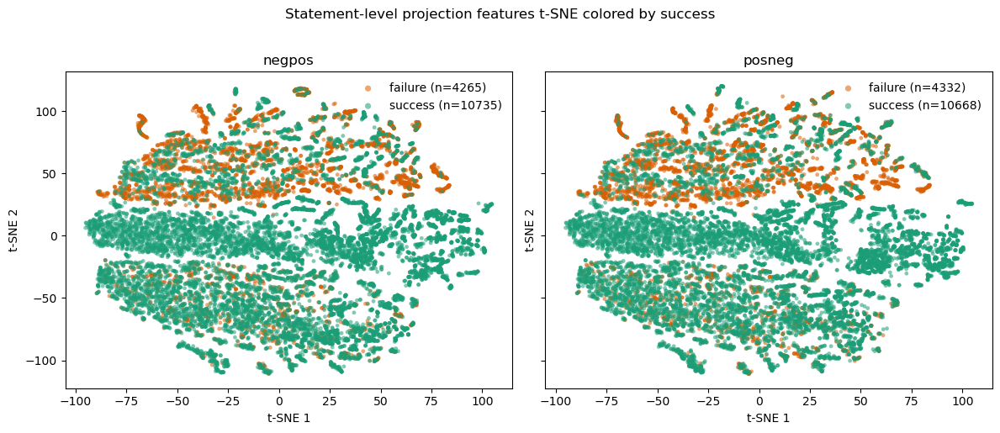

In [12]:
# t-SNE visualization for statement-level projection features.
# Color by success to inspect whether successful vs failed statements form visible neighborhoods.

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler

STATEMENT_FEATURE_CSV = globals().get(
    'STATEMENT_FEATURE_CSV',
    Path('contrast_sanity_outputs') / 'statement_level_projection_features_llama.csv',
)
TSNE_OUTPUT_DIR = Path('contrast_sanity_outputs') / 'plots'
TSNE_OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

if 'statement_projection_features_df' not in globals():
    statement_projection_features_df = pd.read_csv(STATEMENT_FEATURE_CSV)


def build_statement_tsne_embedding(
    df: pd.DataFrame,
    feature_mode: str = 'pos_neg',
    sample_size: int = 6000,
    perplexity: float = 35.0,
    pca_components: int = 50,
    random_state: int = 0,
) -> pd.DataFrame:
    feature_cols = classifier_feature_columns(df, mode=feature_mode)
    if not feature_cols:
        raise ValueError(f'No feature columns found for feature_mode={feature_mode!r}')

    meta_cols = [
        'category_key', 'pair_slug', 'concept_label', 'variant',
        'statement_index', 'statement', 'success',
    ]
    meta_cols = [col for col in meta_cols if col in df.columns]
    tsne_df = df.dropna(subset=feature_cols + ['success']).copy()

    if sample_size is not None and len(tsne_df) > sample_size:
        tsne_df = (
            tsne_df
            .groupby(['success', 'variant'], group_keys=False)
            .apply(
                lambda group: group.sample(
                    n=max(1, int(round(sample_size * len(group) / len(df)))),
                    random_state=random_state,
                )
            )
            .sample(frac=1.0, random_state=random_state)
        )
        if len(tsne_df) > sample_size:
            tsne_df = tsne_df.sample(n=sample_size, random_state=random_state)

    X = tsne_df[feature_cols].to_numpy(dtype=np.float64)
    X_scaled = StandardScaler().fit_transform(X)

    if pca_components is not None and X_scaled.shape[1] > pca_components:
        n_components = min(pca_components, X_scaled.shape[0] - 1, X_scaled.shape[1])
        X_for_tsne = PCA(n_components=n_components, random_state=random_state).fit_transform(X_scaled)
    else:
        X_for_tsne = X_scaled

    effective_perplexity = min(perplexity, max(5, (len(tsne_df) - 1) / 3))
    embedding = TSNE(
        n_components=2,
        perplexity=effective_perplexity,
        init='pca',
        learning_rate='auto',
        metric='euclidean',
        random_state=random_state,
    ).fit_transform(X_for_tsne)

    out = tsne_df[meta_cols].reset_index(drop=True).copy()
    out['tsne_1'] = embedding[:, 0]
    out['tsne_2'] = embedding[:, 1]
    out['feature_mode'] = feature_mode
    out['n_features'] = len(feature_cols)
    out['perplexity'] = effective_perplexity
    return out


def plot_statement_tsne(
    embedding_df: pd.DataFrame,
    title: str,
    output_path: Path | None = None,
):
    variants = sorted(embedding_df['variant'].dropna().unique()) if 'variant' in embedding_df else [None]
    ncols = len(variants)
    fig, axes = plt.subplots(1, ncols, figsize=(6 * ncols, 5), sharex=True, sharey=True)
    if ncols == 1:
        axes = [axes]

    colors = {0: '#d95f02', 1: '#1b9e77'}
    labels = {0: 'failure', 1: 'success'}

    for ax, variant in zip(axes, variants):
        subset = embedding_df if variant is None else embedding_df[embedding_df['variant'] == variant]
        for success_value in [0, 1]:
            local = subset[subset['success'] == success_value]
            ax.scatter(
                local['tsne_1'],
                local['tsne_2'],
                s=12,
                alpha=0.55,
                color=colors[success_value],
                label=f'{labels[success_value]} (n={len(local)})',
                edgecolors='none',
            )
        ax.set_title(str(variant) if variant is not None else title)
        ax.set_xlabel('t-SNE 1')
        ax.set_ylabel('t-SNE 2')
        ax.legend(frameon=False, markerscale=1.5)

    fig.suptitle(title, y=1.02)
    fig.tight_layout()
    if output_path is not None:
        fig.savefig(output_path, dpi=200, bbox_inches='tight')
    return fig


statement_tsne_df = build_statement_tsne_embedding(
    statement_projection_features_df,
    feature_mode='pos_neg',
    sample_size=None,
    perplexity=35,
    pca_components=50,
    random_state=0,
)

statement_tsne_csv = TSNE_OUTPUT_DIR / 'statement_level_tsne_pos_neg_llama.csv'
statement_tsne_png = TSNE_OUTPUT_DIR / 'statement_level_tsne_pos_neg_by_success_llama.png'
statement_tsne_df.to_csv(statement_tsne_csv, index=False)

plot_statement_tsne(
    statement_tsne_df,
    title='Statement-level projection features t-SNE colored by success',
    output_path=statement_tsne_png,
)

print(f'Saved t-SNE embedding to: {statement_tsne_csv}')
print(f'Saved t-SNE plot to: {statement_tsne_png}')
display(statement_tsne_df.head())


## Category Leakage / Domain-Shift Diagnostics

If t-SNE separates categories more strongly than success labels, the projection features may be encoding category or concept-pair identity. These checks visualize the same embedding by category and evaluate whether success prediction works within categories or when holding out a full category.


Saved category-colored t-SNE plot to: contrast_sanity_outputs/plots/statement_level_tsne_pos_neg_by_category_llama.png


ValueError: This solver needs samples of at least 2 classes in the data, but the data contains only one class: 1

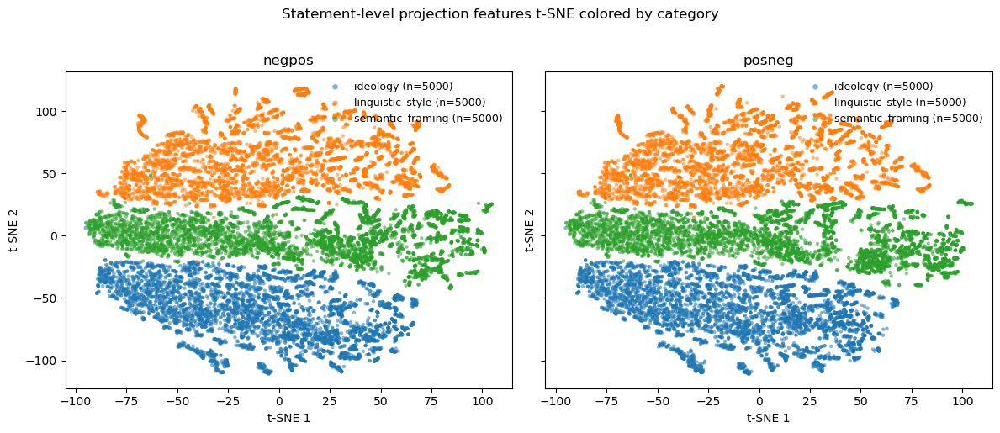

In [13]:
# Diagnose whether category identity dominates the statement-level projection features.

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.base import clone
from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import balanced_accuracy_score, f1_score, roc_auc_score, average_precision_score
from sklearn.model_selection import GroupKFold, cross_val_predict
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

CATEGORY_DIAGNOSTIC_OUTPUT_DIR = Path('contrast_sanity_outputs') / 'plots'
CATEGORY_DIAGNOSTIC_OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

if 'statement_projection_features_df' not in globals():
    statement_projection_features_df = pd.read_csv(STATEMENT_FEATURE_CSV)


def plot_statement_tsne_by_category(
    embedding_df: pd.DataFrame,
    output_path: Path | None = None,
):
    variants = sorted(embedding_df['variant'].dropna().unique())
    categories = sorted(embedding_df['category_key'].dropna().unique())
    cmap = plt.get_cmap('tab10')
    colors = {category: cmap(i % 10) for i, category in enumerate(categories)}

    fig, axes = plt.subplots(1, len(variants), figsize=(6 * len(variants), 5), sharex=True, sharey=True)
    if len(variants) == 1:
        axes = [axes]

    for ax, variant in zip(axes, variants):
        subset = embedding_df[embedding_df['variant'] == variant]
        for category in categories:
            local = subset[subset['category_key'] == category]
            ax.scatter(
                local['tsne_1'],
                local['tsne_2'],
                s=10,
                alpha=0.55,
                color=colors[category],
                label=f'{category} (n={len(local)})',
                edgecolors='none',
            )
        ax.set_title(variant)
        ax.set_xlabel('t-SNE 1')
        ax.set_ylabel('t-SNE 2')
        ax.legend(frameon=False, markerscale=1.5, fontsize=9)

    fig.suptitle('Statement-level projection features t-SNE colored by category', y=1.02)
    fig.tight_layout()
    if output_path is not None:
        fig.savefig(output_path, dpi=200, bbox_inches='tight')
    return fig


if 'statement_tsne_df' in globals():
    category_tsne_png = CATEGORY_DIAGNOSTIC_OUTPUT_DIR / 'statement_level_tsne_pos_neg_by_category_llama.png'
    plot_statement_tsne_by_category(statement_tsne_df, output_path=category_tsne_png)
    print(f'Saved category-colored t-SNE plot to: {category_tsne_png}')
else:
    print('Run the t-SNE cell above first to create statement_tsne_df.')


def binary_metrics_from_scores(y_true, y_score, threshold=0.5):
    y_true = np.asarray(y_true, dtype=int)
    y_score = np.asarray(y_score, dtype=float)
    y_pred = (y_score >= threshold).astype(int)
    out = {
        'n': int(len(y_true)),
        'positive_rate': float(np.mean(y_true)),
        'balanced_accuracy': float(balanced_accuracy_score(y_true, y_pred)),
        'f1': float(f1_score(y_true, y_pred, zero_division=0)),
    }
    if len(np.unique(y_true)) == 2:
        out['roc_auc'] = float(roc_auc_score(y_true, y_score))
        out['average_precision'] = float(average_precision_score(y_true, y_score))
    else:
        out['roc_auc'] = np.nan
        out['average_precision'] = np.nan
    return out


def fit_success_model():
    return Pipeline([
        ('scale', StandardScaler()),
        ('logreg', LogisticRegression(max_iter=2000, class_weight='balanced', solver='liblinear')),
    ])


def safe_group_oof_scores(
    estimator,
    X: np.ndarray,
    y: np.ndarray,
    groups: np.ndarray,
    n_splits: int = 5,
) -> tuple[np.ndarray, int, int]:
    """Out-of-fold predict_proba with folds skipped when train/test has one class."""
    cv = GroupKFold(n_splits=min(n_splits, len(np.unique(groups))))
    y_score = np.full(len(y), np.nan, dtype=np.float64)
    valid_folds = 0
    skipped_folds = 0

    for train_idx, test_idx in cv.split(X, y, groups):
        if len(np.unique(y[train_idx])) < 2 or len(np.unique(y[test_idx])) < 2:
            skipped_folds += 1
            continue
        model = clone(estimator)
        model.fit(X[train_idx], y[train_idx])
        y_score[test_idx] = model.predict_proba(X[test_idx])[:, 1]
        valid_folds += 1

    return y_score, valid_folds, skipped_folds


def metrics_on_scored_rows(y: np.ndarray, y_score: np.ndarray) -> dict[str, float]:
    mask = ~np.isnan(y_score)
    if mask.sum() == 0 or len(np.unique(y[mask])) < 2:
        return {
            'n': int(mask.sum()),
            'positive_rate': float(np.mean(y[mask])) if mask.sum() else np.nan,
            'balanced_accuracy': np.nan,
            'f1': np.nan,
            'roc_auc': np.nan,
            'average_precision': np.nan,
        }
    return binary_metrics_from_scores(y[mask], y_score[mask])


def evaluate_within_category_group_pair(
    df: pd.DataFrame,
    feature_mode: str = 'pos_neg',
    n_splits: int = 5,
) -> pd.DataFrame:
    feature_cols = classifier_feature_columns(df, mode=feature_mode)
    rows = []
    for category, category_df in df.groupby('category_key'):
        model_df = category_df.dropna(subset=feature_cols + ['success', 'pair_slug']).copy()
        n_groups = model_df['pair_slug'].nunique()
        row = {
            'evaluation': 'within_category_group_pair',
            'category_key': category,
            'n_rows': int(len(model_df)),
            'n_pairs': int(n_groups),
            'positive_rate': float(model_df['success'].mean()) if len(model_df) else np.nan,
        }
        if len(model_df) == 0 or n_groups < 2 or model_df['success'].nunique() < 2:
            row.update({
                'valid_folds': 0,
                'skipped_folds': np.nan,
                'skip_reason': 'category has fewer than two labels or fewer than two groups',
            })
            rows.append(row)
            continue

        X = model_df[feature_cols].to_numpy(dtype=np.float64)
        y = model_df['success'].to_numpy(dtype=int)
        groups = model_df['pair_slug'].to_numpy()

        y_score, valid_folds, skipped_folds = safe_group_oof_scores(
            fit_success_model(), X, y, groups, n_splits=n_splits
        )
        dummy_score, dummy_valid_folds, dummy_skipped_folds = safe_group_oof_scores(
            DummyClassifier(strategy='prior'), X, y, groups, n_splits=n_splits
        )

        row.update({
            'valid_folds': int(valid_folds),
            'skipped_folds': int(skipped_folds),
            'dummy_valid_folds': int(dummy_valid_folds),
            'dummy_skipped_folds': int(dummy_skipped_folds),
            'skip_reason': '',
        })
        row.update({f'model_{k}': v for k, v in metrics_on_scored_rows(y, y_score).items()})
        row.update({f'dummy_{k}': v for k, v in metrics_on_scored_rows(y, dummy_score).items()})
        rows.append(row)
    return pd.DataFrame(rows)


def evaluate_leave_one_category_out(
    df: pd.DataFrame,
    feature_mode: str = 'pos_neg',
) -> pd.DataFrame:
    feature_cols = classifier_feature_columns(df, mode=feature_mode)
    model_df = df.dropna(subset=feature_cols + ['success', 'category_key']).copy()
    rows = []
    categories = sorted(model_df['category_key'].unique())
    for heldout_category in categories:
        train_df = model_df[model_df['category_key'] != heldout_category]
        test_df = model_df[model_df['category_key'] == heldout_category]
        row = {
            'evaluation': 'leave_one_category_out',
            'heldout_category': heldout_category,
            'train_n': int(len(train_df)),
            'test_n': int(len(test_df)),
            'train_positive_rate': float(train_df['success'].mean()) if len(train_df) else np.nan,
            'test_positive_rate': float(test_df['success'].mean()) if len(test_df) else np.nan,
        }
        if train_df['success'].nunique() < 2 or test_df['success'].nunique() < 2:
            row['skip_reason'] = 'train or test split has fewer than two labels'
            rows.append(row)
            continue

        X_train = train_df[feature_cols].to_numpy(dtype=np.float64)
        y_train = train_df['success'].to_numpy(dtype=int)
        X_test = test_df[feature_cols].to_numpy(dtype=np.float64)
        y_test = test_df['success'].to_numpy(dtype=int)

        model = fit_success_model()
        model.fit(X_train, y_train)
        y_score = model.predict_proba(X_test)[:, 1]

        dummy = DummyClassifier(strategy='prior')
        dummy.fit(X_train, y_train)
        dummy_score = dummy.predict_proba(X_test)[:, 1]

        row['skip_reason'] = ''
        row.update({f'model_{k}': v for k, v in binary_metrics_from_scores(y_test, y_score).items()})
        row.update({f'dummy_{k}': v for k, v in binary_metrics_from_scores(y_test, dummy_score).items()})
        rows.append(row)
    return pd.DataFrame(rows)


within_category_metrics = evaluate_within_category_group_pair(statement_projection_features_df, feature_mode='pos_neg')
leave_category_metrics = evaluate_leave_one_category_out(statement_projection_features_df, feature_mode='pos_neg')

print('Within-category, held-out-pair evaluation:')
display(within_category_metrics)

print('Leave-one-category-out evaluation:')
display(leave_category_metrics)


## Category-Centered Feature Experiment

Subtract the feature mean within each category before rerunning the success classifier and t-SNE. This removes category-level offsets while preserving within-category variation across statements, variants, and concept pairs.


,category_key,max_abs_centered_feature_mean
0,ideology,1.603695e-15
1,linguistic_style,7.437606e-16
2,semantic_framing,1.041034e-15


Category-centered group-pair classifier:
Rows: 30000 | pairs: 150 | features: 56


,model,n,positive_rate,balanced_accuracy,f1,roc_auc,average_precision
0,dummy_baseline,30000,0.504233,0.437382,0.491261,0.417034,0.458078
1,logistic_category_centered,30000,0.504233,0.381845,0.382965,0.336596,0.398589


,category_key,n,positive_rate,balanced_accuracy,f1,roc_auc,average_precision
0,ideology,10000,0.3814,0.529759,0.488085,0.533788,0.403071
1,linguistic_style,10000,0.1708,0.492594,0.268170,0.477023,0.155090
2,semantic_framing,10000,0.9605,0.508457,0.380618,0.497689,0.963081


,features,n,positive_rate,balanced_accuracy,f1,roc_auc,average_precision
0,raw,30000,0.504233,0.778798,0.766098,0.844619,0.870238
1,category_centered,30000,0.504233,0.381845,0.382965,0.336596,0.398589


Saved category-centered t-SNE embedding to: contrast_sanity_outputs/plots/statement_level_tsne_category_centered_pos_neg_llama.csv
Saved success-colored category-centered t-SNE plot to: contrast_sanity_outputs/plots/statement_level_tsne_category_centered_pos_neg_by_success_llama.png
Saved category-colored category-centered t-SNE plot to: contrast_sanity_outputs/plots/statement_level_tsne_category_centered_pos_neg_by_category_llama.png


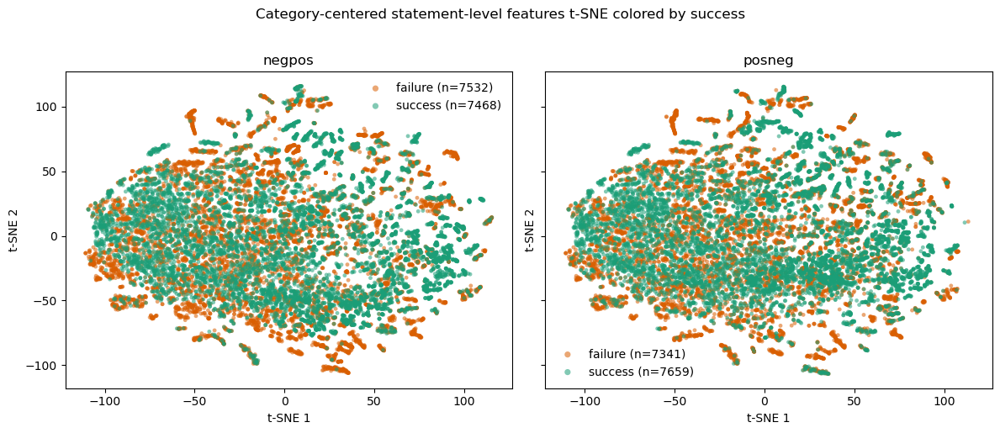

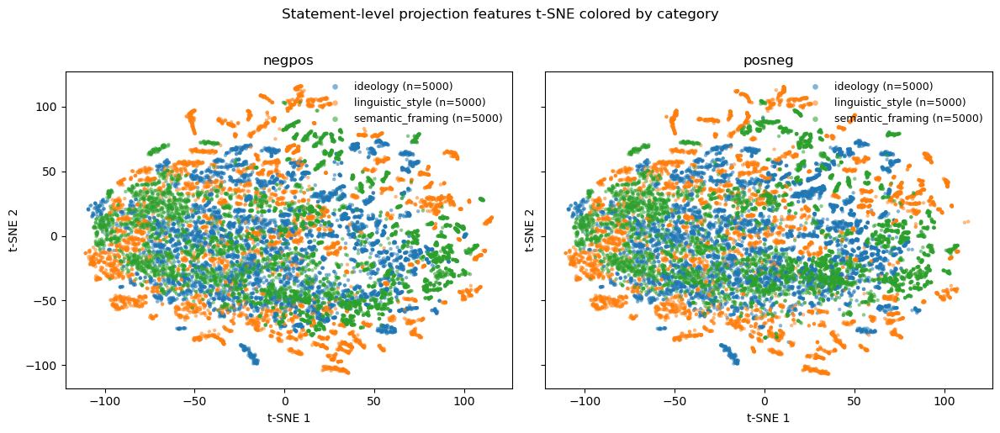

In [ ]:
# Category-wise centering experiment.
# Use this when category identity dominates the raw projection features.

import numpy as np
import pandas as pd

CATEGORY_CENTERED_OUTPUT_DIR = Path('contrast_sanity_outputs') / 'plots'
CATEGORY_CENTERED_OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

if 'statement_projection_features_df' not in globals():
    statement_projection_features_df = pd.read_csv(STATEMENT_FEATURE_CSV)

feature_mode = 'pos_neg'
feature_cols = classifier_feature_columns(statement_projection_features_df, mode=feature_mode)

category_centered_df = statement_projection_features_df.copy()
category_centered_df[feature_cols] = (
    category_centered_df[feature_cols]
    - category_centered_df.groupby('category_key')[feature_cols].transform('mean')
)

# Optional sanity check: after centering, each category's feature mean should be close to zero.
category_centering_check = (
    category_centered_df
    .groupby('category_key')[feature_cols]
    .mean()
    .abs()
    .max(axis=1)
    .rename('max_abs_centered_feature_mean')
    .reset_index()
)
display(category_centering_check)

# Rerun the same held-out-pair classifier on centered features.
category_centered_group_result = evaluate_logistic_projection_classifier(
    category_centered_df,
    feature_mode=feature_mode,
    split='group_pair',
    n_splits=5,
)

print('Category-centered group-pair classifier:')
print(f"Rows: {category_centered_group_result['n_rows']} | pairs: {category_centered_group_result['n_pairs']} | features: {category_centered_group_result['n_features']}")
display(pd.DataFrame([
    {'model': 'dummy_baseline', **category_centered_group_result['dummy_baseline_metrics']},
    {'model': 'logistic_category_centered', **category_centered_group_result['overall_metrics']},
]))
display(category_centered_group_result['category_metrics'])

# Compare against the raw-feature classifier if it already exists in the notebook state.
if 'classifier_results' in globals() and feature_mode in classifier_results:
    raw_group_result = classifier_results[feature_mode]
    display(pd.DataFrame([
        {'features': 'raw', **raw_group_result['overall_metrics']},
        {'features': 'category_centered', **category_centered_group_result['overall_metrics']},
    ]))

# Rerun t-SNE on category-centered features.
category_centered_tsne_df = build_statement_tsne_embedding(
    category_centered_df,
    feature_mode=feature_mode,
    sample_size=None,
    perplexity=35,
    pca_components=50,
    random_state=0,
)

category_centered_tsne_csv = CATEGORY_CENTERED_OUTPUT_DIR / 'statement_level_tsne_category_centered_pos_neg_llama.csv'
category_centered_tsne_success_png = CATEGORY_CENTERED_OUTPUT_DIR / 'statement_level_tsne_category_centered_pos_neg_by_success_llama.png'
category_centered_tsne_category_png = CATEGORY_CENTERED_OUTPUT_DIR / 'statement_level_tsne_category_centered_pos_neg_by_category_llama.png'

category_centered_tsne_df.to_csv(category_centered_tsne_csv, index=False)

plot_statement_tsne(
    category_centered_tsne_df,
    title='Category-centered statement-level features t-SNE colored by success',
    output_path=category_centered_tsne_success_png,
)

plot_statement_tsne_by_category(
    category_centered_tsne_df,
    output_path=category_centered_tsne_category_png,
)

print(f'Saved category-centered t-SNE embedding to: {category_centered_tsne_csv}')
print(f'Saved success-colored category-centered t-SNE plot to: {category_centered_tsne_success_png}')
print(f'Saved category-colored category-centered t-SNE plot to: {category_centered_tsne_category_png}')


## Pair-Centered Nonlinear / Trajectory Feature Experiment

Remove category + pair + order offsets, then test whether nonlinear models or layer-trajectory summaries recover a success signal. This is the stricter test: if performance improves here, the signal is likely in within-pair residual geometry rather than absolute category identity.


In [15]:
# Pair-centered nonlinear and trajectory-feature experiment.
# This is a stricter test than raw/category-centered features because it removes
# category + concept-pair + order offsets before fitting success predictors.

import numpy as np
import pandas as pd

from sklearn.base import clone
from sklearn.dummy import DummyClassifier
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.kernel_approximation import RBFSampler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import average_precision_score, balanced_accuracy_score, f1_score, roc_auc_score
from sklearn.model_selection import GroupKFold, cross_val_predict
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

PAIR_CENTERED_OUTPUT_DIR = Path('contrast_sanity_outputs')
PAIR_CENTERED_OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

if 'statement_projection_features_df' not in globals():
    statement_projection_features_df = pd.read_csv(STATEMENT_FEATURE_CSV)


def layer_feature_columns(df: pd.DataFrame, feature_name: str) -> list[str]:
    cols = []
    for col in df.columns:
        parts = col.split('_', 2)
        if len(parts) == 3 and parts[0] == 'layer' and parts[1].isdigit() and parts[2] == feature_name:
            cols.append(col)
    return sorted(cols, key=lambda c: int(c.split('_')[1]))


def all_layer_projection_feature_columns(df: pd.DataFrame) -> list[str]:
    feature_names = [
        'pos_projection',
        'neg_projection',
        'pos_minus_neg',
        'abs_pos_minus_neg',
        'min_pos_neg',
    ]
    cols = []
    for feature_name in feature_names:
        cols.extend(layer_feature_columns(df, feature_name))
    return cols


def make_group_centered_df(
    df: pd.DataFrame,
    group_cols: list[str],
    feature_cols: list[str],
) -> pd.DataFrame:
    centered = df.copy()
    centered[feature_cols] = centered[feature_cols] - centered.groupby(group_cols)[feature_cols].transform('mean')
    return centered


def add_layer_trajectory_features(
    df: pd.DataFrame,
    base_feature_names: tuple[str, ...] = ('pos_projection', 'neg_projection', 'pos_minus_neg'),
) -> tuple[pd.DataFrame, list[str]]:
    out = df.copy()
    new_cols = []

    for feature_name in base_feature_names:
        cols = layer_feature_columns(out, feature_name)
        if len(cols) < 2:
            continue

        values = out[cols].to_numpy(dtype=np.float64)
        layer_ids = np.array([int(col.split('_')[1]) for col in cols], dtype=np.float64)
        centered_layers = layer_ids - layer_ids.mean()
        denom = np.sum(centered_layers ** 2)

        prefix = f'traj_{feature_name}'
        out[f'{prefix}_mean'] = np.nanmean(values, axis=1)
        out[f'{prefix}_std'] = np.nanstd(values, axis=1)
        out[f'{prefix}_min'] = np.nanmin(values, axis=1)
        out[f'{prefix}_max'] = np.nanmax(values, axis=1)
        out[f'{prefix}_late_minus_early'] = values[:, -1] - values[:, 0]
        out[f'{prefix}_late_mean_minus_early_mean'] = np.nanmean(values[:, -5:], axis=1) - np.nanmean(values[:, :5], axis=1)
        out[f'{prefix}_slope'] = (values @ centered_layers) / denom
        out[f'{prefix}_abs_mean'] = np.nanmean(np.abs(values), axis=1)

        new_cols.extend([
            f'{prefix}_mean',
            f'{prefix}_std',
            f'{prefix}_min',
            f'{prefix}_max',
            f'{prefix}_late_minus_early',
            f'{prefix}_late_mean_minus_early_mean',
            f'{prefix}_slope',
            f'{prefix}_abs_mean',
        ])

    return out, new_cols


def binary_metrics_for_scores(y_true: np.ndarray, y_score: np.ndarray, threshold: float = 0.5) -> dict[str, float]:
    y_true = np.asarray(y_true, dtype=int)
    y_score = np.asarray(y_score, dtype=float)
    y_pred = (y_score >= threshold).astype(int)
    out = {
        'n': int(len(y_true)),
        'positive_rate': float(np.mean(y_true)),
        'balanced_accuracy': float(balanced_accuracy_score(y_true, y_pred)),
        'f1': float(f1_score(y_true, y_pred, zero_division=0)),
    }
    if len(np.unique(y_true)) == 2:
        out['roc_auc'] = float(roc_auc_score(y_true, y_score))
        out['average_precision'] = float(average_precision_score(y_true, y_score))
    else:
        out['roc_auc'] = np.nan
        out['average_precision'] = np.nan
    return out


def model_zoo(n_features: int, random_state: int = 0) -> dict[str, object]:
    # RBF is approximated to avoid the O(n^2) cost of exact kernel SVM on 30k rows.
    return {
        'dummy_prior': DummyClassifier(strategy='prior'),
        'logistic': Pipeline([
            ('scale', StandardScaler()),
            ('logreg', LogisticRegression(max_iter=3000, class_weight='balanced', solver='liblinear')),
        ]),
        'gradient_boosting': HistGradientBoostingClassifier(
            max_iter=200,
            learning_rate=0.05,
            l2_regularization=0.01,
            class_weight='balanced',
            random_state=random_state,
        ),
        'rbf_features_logistic': Pipeline([
            ('scale', StandardScaler()),
            ('rbf', RBFSampler(gamma=1.0 / max(1, n_features), n_components=500, random_state=random_state)),
            ('logreg', LogisticRegression(max_iter=3000, class_weight='balanced', solver='liblinear')),
        ]),
    }


def evaluate_models_group_pair(
    df: pd.DataFrame,
    feature_cols: list[str],
    label_col: str = 'success',
    group_col: str = 'pair_slug',
    n_splits: int = 5,
    random_state: int = 0,
) -> pd.DataFrame:
    model_df = df.dropna(subset=feature_cols + [label_col, group_col]).copy()
    X = model_df[feature_cols].to_numpy(dtype=np.float64)
    y = model_df[label_col].to_numpy(dtype=int)
    groups = model_df[group_col].to_numpy()
    actual_splits = min(n_splits, model_df[group_col].nunique())
    cv = GroupKFold(n_splits=actual_splits)

    rows = []
    for model_name, estimator in model_zoo(len(feature_cols), random_state=random_state).items():
        y_score = cross_val_predict(
            clone(estimator),
            X,
            y,
            cv=cv,
            groups=groups,
            method='predict_proba',
        )[:, 1]
        row = {
            'model': model_name,
            'n_features': len(feature_cols),
            'n_pairs': int(model_df[group_col].nunique()),
            'split': f'GroupKFold({group_col})',
        }
        row.update(binary_metrics_for_scores(y, y_score))
        rows.append(row)

    return pd.DataFrame(rows).sort_values('roc_auc', ascending=False)


base_projection_cols = all_layer_projection_feature_columns(statement_projection_features_df)
pos_neg_cols = classifier_feature_columns(statement_projection_features_df, mode='pos_neg')

pair_centered_df = make_group_centered_df(
    statement_projection_features_df,
    group_cols=['category_key', 'pair_slug', 'variant'],
    feature_cols=base_projection_cols,
)

pair_centering_check = (
    pair_centered_df
    .groupby(['category_key', 'pair_slug', 'variant'])[base_projection_cols]
    .mean()
    .abs()
    .max(axis=1)
    .rename('max_abs_centered_feature_mean')
    .reset_index()
)
print('Pair-centering sanity check:')
display(pair_centering_check['max_abs_centered_feature_mean'].describe())

pair_centered_with_traj_df, trajectory_cols = add_layer_trajectory_features(
    pair_centered_df,
    base_feature_names=('pos_projection', 'neg_projection', 'pos_minus_neg'),
)

pair_centered_pos_neg_results = evaluate_models_group_pair(
    pair_centered_df,
    feature_cols=pos_neg_cols,
    n_splits=5,
    random_state=0,
)

pair_centered_traj_results = evaluate_models_group_pair(
    pair_centered_with_traj_df,
    feature_cols=pos_neg_cols + trajectory_cols,
    n_splits=5,
    random_state=0,
)

print('Pair-centered pos/neg layer features:')
display(pair_centered_pos_neg_results)

print('Pair-centered pos/neg + trajectory features:')
display(pair_centered_traj_results)

# Compare against the existing raw and category-centered linear results if available.
summary_rows = []
if 'classifier_results' in globals() and 'pos_neg' in classifier_results:
    summary_rows.append({'features': 'raw_pos_neg', 'model': 'logistic', **classifier_results['pos_neg']['overall_metrics']})
if 'category_centered_group_result' in globals():
    summary_rows.append({'features': 'category_centered_pos_neg', 'model': 'logistic', **category_centered_group_result['overall_metrics']})

for _, row in pair_centered_pos_neg_results.iterrows():
    summary_rows.append({'features': 'pair_centered_pos_neg', **row.to_dict()})
for _, row in pair_centered_traj_results.iterrows():
    summary_rows.append({'features': 'pair_centered_pos_neg_plus_trajectory', **row.to_dict()})

model_comparison_df = pd.DataFrame(summary_rows)
display(model_comparison_df)

model_comparison_csv = PAIR_CENTERED_OUTPUT_DIR / 'pair_centered_nonlinear_model_comparison_llama.csv'
model_comparison_df.to_csv(model_comparison_csv, index=False)
print(f'Saved model comparison to: {model_comparison_csv}')


Pair-centering sanity check:


count    3.000000e+02
mean     1.783892e-15
std      7.196310e-16
min      3.641532e-16
25%      1.221245e-15
50%      1.687539e-15
75%      2.313705e-15
max      4.014566e-15
Name: max_abs_centered_feature_mean, dtype: float64

Pair-centered pos/neg layer features:


,model,n_features,n_pairs,split,n,positive_rate,balanced_accuracy,f1,roc_auc,average_precision
2,gradient_boosting,56,150,GroupKFold(pair_slug),30000,0.713433,0.758476,0.826289,0.828986,0.924645
3,rbf_features_logistic,56,150,GroupKFold(pair_slug),30000,0.713433,0.744423,0.797487,0.810019,0.911174
1,logistic,56,150,GroupKFold(pair_slug),30000,0.713433,0.509250,0.608456,0.516498,0.726144
0,dummy_prior,56,150,GroupKFold(pair_slug),30000,0.713433,0.500000,0.832753,0.400675,0.667886


Pair-centered pos/neg + trajectory features:


,model,n_features,n_pairs,split,n,positive_rate,balanced_accuracy,f1,roc_auc,average_precision
2,gradient_boosting,80,150,GroupKFold(pair_slug),30000,0.713433,0.753506,0.823786,0.827032,0.923319
3,rbf_features_logistic,80,150,GroupKFold(pair_slug),30000,0.713433,0.730539,0.793720,0.797744,0.904504
1,logistic,80,150,GroupKFold(pair_slug),30000,0.713433,0.644148,0.730345,0.693990,0.824947
0,dummy_prior,80,150,GroupKFold(pair_slug),30000,0.713433,0.500000,0.832753,0.400675,0.667886


,features,model,n,positive_rate,balanced_accuracy,f1,roc_auc,average_precision,n_features,n_pairs,split
0,raw_pos_neg,logistic,30000,0.713433,0.771635,0.829094,0.856746,0.941449,NaN,NaN,NaN
1,pair_centered_pos_neg,gradient_boosting,30000,0.713433,0.758476,0.826289,0.828986,0.924645,56.0,150.0,GroupKFold(pair_slug)
2,pair_centered_pos_neg,rbf_features_logistic,30000,0.713433,0.744423,0.797487,0.810019,0.911174,56.0,150.0,GroupKFold(pair_slug)
3,pair_centered_pos_neg,logistic,30000,0.713433,0.509250,0.608456,0.516498,0.726144,56.0,150.0,GroupKFold(pair_slug)
4,pair_centered_pos_neg,dummy_prior,30000,0.713433,0.500000,0.832753,0.400675,0.667886,56.0,150.0,GroupKFold(pair_slug)
5,pair_centered_pos_neg_plus_trajectory,gradient_boosting,30000,0.713433,0.753506,0.823786,0.827032,0.923319,80.0,150.0,GroupKFold(pair_slug)
6,pair_centered_pos_neg_plus_trajectory,rbf_features_logistic,30000,0.713433,0.730539,0.793720,0.797744,0.904504,80.0,150.0,GroupKFold(pair_slug)
7,pair_centered_pos_neg_plus_trajectory,logistic,30000,0.713433,0.644148,0.730345,0.693990,0.824947,80.0,150.0,GroupKFold(pair_slug)
8,pair_centered_pos_neg_plus_trajectory,dummy_prior,30000,0.713433,0.500000,0.832753,0.400675,0.667886,80.0,150.0,GroupKFold(pair_slug)


Saved model comparison to: contrast_sanity_outputs/pair_centered_nonlinear_model_comparison_llama.csv


## Per-Category Metrics for Pair-Centered Models

Break down the pair-centered nonlinear experiment by category using out-of-fold predictions from `GroupKFold(pair_slug)`. This reports plain accuracy, balanced accuracy, F1, ROC-AUC, and average precision for each category.


In [16]:
# Per-category metrics for the pair-centered nonlinear experiment.
# Run this after the pair-centered nonlinear / trajectory feature cell above.

import numpy as np
import pandas as pd

from sklearn.base import clone
from sklearn.metrics import accuracy_score, average_precision_score, balanced_accuracy_score, f1_score, roc_auc_score
from sklearn.model_selection import GroupKFold, cross_val_predict


def binary_metrics_for_scores_with_accuracy(y_true: np.ndarray, y_score: np.ndarray, threshold: float = 0.5) -> dict[str, float]:
    y_true = np.asarray(y_true, dtype=int)
    y_score = np.asarray(y_score, dtype=float)
    y_pred = (y_score >= threshold).astype(int)
    out = {
        'n': int(len(y_true)),
        'positive_rate': float(np.mean(y_true)),
        'accuracy': float(accuracy_score(y_true, y_pred)),
        'balanced_accuracy': float(balanced_accuracy_score(y_true, y_pred)),
        'f1': float(f1_score(y_true, y_pred, zero_division=0)),
    }
    if len(np.unique(y_true)) == 2:
        out['roc_auc'] = float(roc_auc_score(y_true, y_score))
        out['average_precision'] = float(average_precision_score(y_true, y_score))
    else:
        out['roc_auc'] = np.nan
        out['average_precision'] = np.nan
    return out


def oof_predictions_group_pair(
    df: pd.DataFrame,
    feature_cols: list[str],
    model_name: str,
    estimator,
    label_col: str = 'success',
    group_col: str = 'pair_slug',
    n_splits: int = 5,
) -> pd.DataFrame:
    model_df = df.dropna(subset=feature_cols + [label_col, group_col, 'category_key']).copy()
    X = model_df[feature_cols].to_numpy(dtype=np.float64)
    y = model_df[label_col].to_numpy(dtype=int)
    groups = model_df[group_col].to_numpy()
    cv = GroupKFold(n_splits=min(n_splits, model_df[group_col].nunique()))

    y_score = cross_val_predict(
        clone(estimator),
        X,
        y,
        cv=cv,
        groups=groups,
        method='predict_proba',
    )[:, 1]

    return model_df[['category_key', 'pair_slug', 'variant', 'statement_index', label_col]].assign(
        model=model_name,
        pred_success_prob=y_score,
        pred_success=(y_score >= 0.5).astype(int),
    )


def per_category_metrics_from_predictions(pred_df: pd.DataFrame) -> pd.DataFrame:
    rows = []
    for (model_name, category_key), group in pred_df.groupby(['model', 'category_key']):
        row = {
            'model': model_name,
            'category_key': category_key,
        }
        row.update(binary_metrics_for_scores_with_accuracy(group['success'], group['pred_success_prob']))
        rows.append(row)
    return pd.DataFrame(rows).sort_values(['model', 'category_key'])


# Recreate pair-centered data if this cell is run independently after loading the notebook.
base_projection_cols = all_layer_projection_feature_columns(statement_projection_features_df)
pos_neg_cols = classifier_feature_columns(statement_projection_features_df, mode='pos_neg')

if 'pair_centered_df' not in globals():
    pair_centered_df = make_group_centered_df(
        statement_projection_features_df,
        group_cols=['category_key', 'pair_slug', 'variant'],
        feature_cols=base_projection_cols,
    )

if 'pair_centered_with_traj_df' not in globals() or 'trajectory_cols' not in globals():
    pair_centered_with_traj_df, trajectory_cols = add_layer_trajectory_features(
        pair_centered_df,
        base_feature_names=('pos_projection', 'neg_projection', 'pos_minus_neg'),
    )

per_category_prediction_frames = []

for model_name, estimator in model_zoo(len(pos_neg_cols), random_state=0).items():
    per_category_prediction_frames.append(
        oof_predictions_group_pair(
            pair_centered_df,
            feature_cols=pos_neg_cols,
            model_name=f'pair_centered_pos_neg__{model_name}',
            estimator=estimator,
            n_splits=5,
        )
    )

trajectory_feature_cols = pos_neg_cols + trajectory_cols
for model_name, estimator in model_zoo(len(trajectory_feature_cols), random_state=0).items():
    per_category_prediction_frames.append(
        oof_predictions_group_pair(
            pair_centered_with_traj_df,
            feature_cols=trajectory_feature_cols,
            model_name=f'pair_centered_pos_neg_plus_trajectory__{model_name}',
            estimator=estimator,
            n_splits=5,
        )
    )

pair_centered_per_category_predictions_df = pd.concat(per_category_prediction_frames, ignore_index=True)
pair_centered_per_category_metrics_df = per_category_metrics_from_predictions(pair_centered_per_category_predictions_df)

print('Per-category metrics for pair-centered models:')
display(pair_centered_per_category_metrics_df)

pair_centered_per_category_metrics_csv = PAIR_CENTERED_OUTPUT_DIR / 'pair_centered_per_category_metrics_llama.csv'
pair_centered_per_category_predictions_csv = PAIR_CENTERED_OUTPUT_DIR / 'pair_centered_per_category_oof_predictions_llama.csv'

pair_centered_per_category_metrics_df.to_csv(pair_centered_per_category_metrics_csv, index=False)
pair_centered_per_category_predictions_df.to_csv(pair_centered_per_category_predictions_csv, index=False)

print(f'Saved per-category metrics to: {pair_centered_per_category_metrics_csv}')
print(f'Saved per-category OOF predictions to: {pair_centered_per_category_predictions_csv}')


Per-category metrics for pair-centered models:


,model,category_key,n,positive_rate,accuracy,balanced_accuracy,f1,roc_auc,average_precision
0,pair_centered_pos_neg__dummy_prior,ideology,10000,0.7967,0.7967,0.500000,0.886848,0.464604,0.784325
1,pair_centered_pos_neg__dummy_prior,linguistic_style,10000,0.3437,0.3437,0.500000,0.511573,0.327588,0.273991
2,pair_centered_pos_neg__dummy_prior,semantic_framing,10000,0.9999,0.9999,0.500000,0.999950,0.890039,0.999978
3,pair_centered_pos_neg__gradient_boosting,ideology,10000,0.7967,0.6935,0.530122,0.807221,0.552520,0.822220
4,pair_centered_pos_neg__gradient_boosting,linguistic_style,10000,0.3437,0.6423,0.529939,0.246789,0.545035,0.396623
5,pair_centered_pos_neg__gradient_boosting,semantic_framing,10000,0.9999,0.9643,0.482198,0.981826,0.312231,0.999884
6,pair_centered_pos_neg__logistic,ideology,10000,0.7967,0.5282,0.527865,0.640889,0.540743,0.807551
7,pair_centered_pos_neg__logistic,linguistic_style,10000,0.3437,0.4979,0.505502,0.420409,0.510876,0.359837
8,pair_centered_pos_neg__logistic,semantic_framing,10000,0.9999,0.5237,0.261876,0.687406,0.352635,0.999896
9,pair_centered_pos_neg__rbf_features_logistic,ideology,10000,0.7967,0.6630,0.535893,0.780055,0.549710,0.814858


Saved per-category metrics to: contrast_sanity_outputs/pair_centered_per_category_metrics_llama.csv
Saved per-category OOF predictions to: contrast_sanity_outputs/pair_centered_per_category_oof_predictions_llama.csv


## Shared / Contrast-Clean Concept Vector Experiment

Use the decomposition from `cos_sim_new.ipynb`: split `base_to_pos` and `base_to_neg` into a shared category shift and a signed positive-vs-negative contrast axis. The clean contrast removes the component parallel to the shared shift, which should reduce category leakage.


In [17]:
# Shared / contrast-clean concept vector experiment for statement-level success prediction.
# Direction convention:
#   contrast = base_to_pos - base_to_neg = pos_mean - neg_mean
#   positive contrast score => closer to the positive concept side
#   negative contrast score => closer to the negative concept side

import numpy as np
import pandas as pd

DECOMP_OUTPUT_DIR = Path('contrast_sanity_outputs')
DECOMP_PLOT_OUTPUT_DIR = DECOMP_OUTPUT_DIR / 'plots'
DECOMP_OUTPUT_DIR.mkdir(parents=True, exist_ok=True)
DECOMP_PLOT_OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

DECOMP_FEATURE_CSV = DECOMP_OUTPUT_DIR / 'statement_level_shared_contrast_clean_features_llama.csv'

if 'statement_success_labels_df' not in globals():
    statement_success_labels_df = load_statement_success_labels(JUDGEMENT_JSONL)


def remove_projection(vector: np.ndarray, basis: np.ndarray) -> np.ndarray:
    basis_sq_norm = float(np.dot(basis, basis))
    if basis_sq_norm == 0.0:
        return vector.copy()
    return vector - basis * (float(np.dot(vector, basis)) / basis_sq_norm)


def load_decomposed_concept_vectors(
    vector_root: Path,
    category_key: str,
    pair_slug: str,
) -> dict[str, np.ndarray]:
    pair_vector_dir = vector_root / category_key / pair_slug
    base_to_pos_path = pair_vector_dir / 'base_to_pos.npy'
    base_to_neg_path = pair_vector_dir / 'base_to_neg.npy'
    if not base_to_pos_path.exists() or not base_to_neg_path.exists():
        raise FileNotFoundError(f'Missing base_to_pos/base_to_neg vectors under {pair_vector_dir}')

    base_to_pos = np.load(base_to_pos_path).astype(np.float64)
    base_to_neg = np.load(base_to_neg_path).astype(np.float64)
    shared = (base_to_pos + base_to_neg) / 2.0
    contrast = base_to_pos - base_to_neg
    contrast_clean = np.stack([
        remove_projection(contrast[layer_idx], shared[layer_idx])
        for layer_idx in range(contrast.shape[0])
    ])
    return {
        'shared': shared,
        'contrast': contrast,
        'contrast_clean': contrast_clean,
    }


def build_statement_level_decomposition_features(
    hidden_root: Path,
    vector_root: Path,
    labels_df: pd.DataFrame,
    variants: tuple[str, ...] = COMBINED_VARIANTS,
) -> pd.DataFrame:
    label_lookup = {
        (row.category_key, row.pair_slug, row.variant, row.statement_index): row.success
        for row in labels_df.itertuples(index=False)
    }

    rows = []
    skipped_without_label = 0

    for pair_info in iter_combined_pair_infos(hidden_root):
        pair_dir = pair_info['pair_dir']
        pair_slug = pair_info['pair_slug']
        category_key = pair_info['category_key']
        layer_to_index = layer_index_map(pair_info['layers'])
        decomp_vectors = load_decomposed_concept_vectors(vector_root, category_key, pair_slug)

        metadata = json.loads((pair_dir / 'metadata.json').read_text(encoding='utf-8'))
        examples = metadata.get('examples', [])

        for variant in variants:
            if variant not in pair_info['available_variants']:
                continue

            variant_examples = [example for example in examples if example.get('variant') == variant]
            if not variant_examples:
                continue

            sample_rows = []
            for row_idx, example in enumerate(variant_examples):
                statement_index = example.get('statement_index')
                label_key = (category_key, pair_slug, variant, statement_index)
                if label_key not in label_lookup:
                    skipped_without_label += 1
                    continue
                sample_rows.append({
                    'row_idx': row_idx,
                    'category_key': category_key,
                    'category_name': pair_info['category_name'],
                    'pair_slug': pair_slug,
                    'concept_label': f"{pair_info['positive_concept']} vs {pair_info['negative_concept']}",
                    'positive_concept': pair_info['positive_concept'],
                    'negative_concept': pair_info['negative_concept'],
                    'variant': variant,
                    'statement_index': statement_index,
                    'statement': example.get('statement', ''),
                    'success': label_lookup[label_key],
                })

            if not sample_rows:
                continue

            by_row_idx = {row['row_idx']: row for row in sample_rows}
            kept_indices = np.array(sorted(by_row_idx), dtype=int)

            for layer in sorted(pair_info['layers']):
                layer_index = layer_to_index[layer]
                hidden = load_layer_matrix(pair_dir, variant, layer).astype(np.float64)

                shared_unit = unit_vector(decomp_vectors['shared'][layer].astype(np.float64))
                contrast_unit = unit_vector(decomp_vectors['contrast'][layer].astype(np.float64))
                contrast_clean_unit = unit_vector(decomp_vectors['contrast_clean'][layer].astype(np.float64))

                shared_projection = hidden[kept_indices] @ shared_unit
                contrast_projection = hidden[kept_indices] @ contrast_unit
                contrast_clean_projection = hidden[kept_indices] @ contrast_clean_unit

                for source_row_idx, shared_value, contrast_value, contrast_clean_value in zip(
                    kept_indices,
                    shared_projection,
                    contrast_projection,
                    contrast_clean_projection,
                ):
                    target = by_row_idx[int(source_row_idx)]
                    target[f'layer_{layer_index}_shared_projection'] = float(shared_value)
                    target[f'layer_{layer_index}_contrast_projection'] = float(contrast_value)
                    target[f'layer_{layer_index}_abs_contrast_projection'] = float(abs(contrast_value))
                    target[f'layer_{layer_index}_contrast_clean_projection'] = float(contrast_clean_value)
                    target[f'layer_{layer_index}_abs_contrast_clean_projection'] = float(abs(contrast_clean_value))

            rows.extend(by_row_idx[row_idx] for row_idx in sorted(by_row_idx))

    features = pd.DataFrame(rows)
    if features.empty:
        raise ValueError('No decomposition feature rows were built.')

    print(f'Built {len(features)} shared/contrast-clean statement-level rows')
    print(f'Skipped rows without labels: {skipped_without_label}')
    display(features.groupby('category_key')['success'].agg(['count', 'mean']))
    return features


def decomposition_feature_columns(df: pd.DataFrame, mode: str) -> list[str]:
    names_by_mode = {
        'shared': {'shared_projection'},
        'contrast': {'contrast_projection'},
        'abs_contrast': {'abs_contrast_projection'},
        'contrast_clean': {'contrast_clean_projection'},
        'abs_contrast_clean': {'abs_contrast_clean_projection'},
        'contrast_clean_signed_abs': {'contrast_clean_projection', 'abs_contrast_clean_projection'},
        'shared_contrast_clean': {'shared_projection', 'contrast_clean_projection', 'abs_contrast_clean_projection'},
        'all_decomposition': {
            'shared_projection',
            'contrast_projection',
            'abs_contrast_projection',
            'contrast_clean_projection',
            'abs_contrast_clean_projection',
        },
    }
    if mode not in names_by_mode:
        raise ValueError(f'Unknown decomposition feature mode: {mode}')

    target_names = names_by_mode[mode]
    cols = []
    for col in df.columns:
        parts = col.split('_', 2)
        if len(parts) != 3 or parts[0] != 'layer' or not parts[1].isdigit():
            continue
        if parts[2] in target_names:
            cols.append(col)
    return sorted(cols, key=lambda c: (int(c.split('_')[1]), c))


def evaluate_decomposition_logistic_modes(
    df: pd.DataFrame,
    modes: list[str],
    split: str = 'group_pair',
    n_splits: int = 5,
) -> tuple[pd.DataFrame, pd.DataFrame]:
    overall_rows = []
    category_rows = []
    for mode in modes:
        feature_cols = decomposition_feature_columns(df, mode)
        # Run the same logistic/CV logic as evaluate_logistic_projection_classifier,
        # but with decomposition-specific feature columns.
        model_df = df.dropna(subset=feature_cols + ['success', 'pair_slug']).copy()
        X = model_df[feature_cols].to_numpy(dtype=np.float64)
        y = model_df['success'].to_numpy(dtype=int)
        groups = model_df['pair_slug'].to_numpy()
        clf = Pipeline([
            ('scale', StandardScaler()),
            ('logreg', LogisticRegression(max_iter=2000, class_weight='balanced', solver='liblinear')),
        ])
        cv = GroupKFold(n_splits=min(n_splits, model_df['pair_slug'].nunique()))
        y_score = cross_val_predict(clf, X, y, cv=cv, groups=groups, method='predict_proba')[:, 1]
        overall = {'feature_mode': mode, 'n_features': len(feature_cols)}
        overall.update(compute_binary_metrics(y, y_score))
        overall_rows.append(overall)

        for category_key, idx in model_df.groupby('category_key').groups.items():
            idx = np.array(list(idx))
            local_positions = model_df.index.get_indexer(idx)
            row = {'feature_mode': mode, 'category_key': category_key, 'n_features': len(feature_cols)}
            row.update(compute_binary_metrics(y[local_positions], y_score[local_positions]))
            category_rows.append(row)

    return pd.DataFrame(overall_rows), pd.DataFrame(category_rows)


decomp_statement_features_df = build_statement_level_decomposition_features(
    COMBINED_HIDDEN_ROOT,
    STEERING_VECTOR_ROOT,
    statement_success_labels_df,
)
decomp_statement_features_df.to_csv(DECOMP_FEATURE_CSV, index=False)
print(f'Saved shared/contrast-clean features to: {DECOMP_FEATURE_CSV}')

DECOMP_MODES = [
    'shared',
    'contrast',
    'abs_contrast',
    'contrast_clean',
    'abs_contrast_clean',
    'contrast_clean_signed_abs',
    'shared_contrast_clean',
    'all_decomposition',
]

decomp_overall_metrics_df, decomp_category_metrics_df = evaluate_decomposition_logistic_modes(
    decomp_statement_features_df,
    DECOMP_MODES,
    split='group_pair',
    n_splits=5,
)

print('Decomposition logistic overall metrics:')
display(decomp_overall_metrics_df.sort_values('roc_auc', ascending=False))

print('Decomposition logistic per-category metrics:')
display(decomp_category_metrics_df.sort_values(['feature_mode', 'category_key']))

decomp_overall_metrics_csv = DECOMP_OUTPUT_DIR / 'decomposition_logistic_overall_metrics_llama.csv'
decomp_category_metrics_csv = DECOMP_OUTPUT_DIR / 'decomposition_logistic_category_metrics_llama.csv'
decomp_overall_metrics_df.to_csv(decomp_overall_metrics_csv, index=False)
decomp_category_metrics_df.to_csv(decomp_category_metrics_csv, index=False)
print(f'Saved decomposition overall metrics to: {decomp_overall_metrics_csv}')
print(f'Saved decomposition category metrics to: {decomp_category_metrics_csv}')


Built 30000 shared/contrast-clean statement-level rows
Skipped rows without labels: 0


,count,mean
category_key,,
ideology,10000,0.7967
linguistic_style,10000,0.3437
semantic_framing,10000,0.9999


Saved shared/contrast-clean features to: contrast_sanity_outputs/statement_level_shared_contrast_clean_features_llama.csv
Decomposition logistic overall metrics:


,feature_mode,n_features,n,positive_rate,balanced_accuracy,f1,roc_auc,average_precision
0,shared,28,30000,0.713433,0.785669,0.830427,0.862497,0.944030
6,shared_contrast_clean,84,30000,0.713433,0.760417,0.831534,0.849009,0.936923
7,all_decomposition,140,30000,0.713433,0.757922,0.829480,0.841331,0.932682
3,contrast_clean,28,30000,0.713433,0.676721,0.770775,0.725297,0.837430
5,contrast_clean_signed_abs,56,30000,0.713433,0.671900,0.773345,0.720673,0.839977
4,abs_contrast_clean,28,30000,0.713433,0.666687,0.757234,0.716077,0.838101
1,contrast,28,30000,0.713433,0.670757,0.755548,0.707737,0.824174
2,abs_contrast,28,30000,0.713433,0.622233,0.720304,0.665000,0.813994


Decomposition logistic per-category metrics:


,feature_mode,category_key,n_features,n,positive_rate,balanced_accuracy,f1,roc_auc,average_precision
6,abs_contrast,ideology,28,10000,0.7967,0.491926,0.708504,0.486846,0.789383
7,abs_contrast,linguistic_style,28,10000,0.3437,0.560423,0.435193,0.594951,0.396124
8,abs_contrast,semantic_framing,28,10000,0.9999,0.368387,0.848391,0.009501,0.999536
12,abs_contrast_clean,ideology,28,10000,0.7967,0.484114,0.739035,0.463202,0.780018
13,abs_contrast_clean,linguistic_style,28,10000,0.3437,0.546927,0.379349,0.583866,0.385333
14,abs_contrast_clean,semantic_framing,28,10000,0.9999,0.911341,0.902716,0.835084,0.999982
21,all_decomposition,ideology,140,10000,0.7967,0.531912,0.766991,0.551522,0.824847
22,all_decomposition,linguistic_style,140,10000,0.3437,0.579079,0.385039,0.619904,0.455938
23,all_decomposition,semantic_framing,140,10000,0.9999,0.498250,0.998197,0.023102,0.999624
3,contrast,ideology,28,10000,0.7967,0.481522,0.741440,0.471760,0.784925


Saved decomposition overall metrics to: contrast_sanity_outputs/decomposition_logistic_overall_metrics_llama.csv
Saved decomposition category metrics to: contrast_sanity_outputs/decomposition_logistic_category_metrics_llama.csv


## Decomposition Nonlinear Follow-Up

Compare nonlinear readouts on the contrast-clean decomposition features, with per-category metrics. Run this after the decomposition feature cell above.


In [18]:
# Nonlinear readouts for shared / contrast-clean decomposition features.
# Uses the model_zoo and per-category helpers defined above.

DECOMP_NONLINEAR_OUTPUT_DIR = Path('contrast_sanity_outputs')

if 'decomp_statement_features_df' not in globals():
    decomp_statement_features_df = pd.read_csv(DECOMP_FEATURE_CSV)

DECOMP_NONLINEAR_MODES = [
    'contrast_clean_signed_abs',
    'shared_contrast_clean',
    'all_decomposition',
]

nonlinear_summary_rows = []
nonlinear_category_rows = []

for mode in DECOMP_NONLINEAR_MODES:
    feature_cols = decomposition_feature_columns(decomp_statement_features_df, mode)
    mode_results = evaluate_models_group_pair(
        decomp_statement_features_df,
        feature_cols=feature_cols,
        n_splits=5,
        random_state=0,
    )
    mode_results = mode_results.assign(feature_mode=mode)
    nonlinear_summary_rows.append(mode_results)

    for model_name, estimator in model_zoo(len(feature_cols), random_state=0).items():
        pred_df = oof_predictions_group_pair(
            decomp_statement_features_df,
            feature_cols=feature_cols,
            model_name=f'{mode}__{model_name}',
            estimator=estimator,
            n_splits=5,
        )
        nonlinear_category_rows.append(per_category_metrics_from_predictions(pred_df))

decomp_nonlinear_overall_df = pd.concat(nonlinear_summary_rows, ignore_index=True)
decomp_nonlinear_category_df = pd.concat(nonlinear_category_rows, ignore_index=True)

print('Decomposition nonlinear overall metrics:')
display(decomp_nonlinear_overall_df.sort_values(['feature_mode', 'roc_auc'], ascending=[True, False]))

print('Decomposition nonlinear per-category metrics:')
display(decomp_nonlinear_category_df.sort_values(['model', 'category_key']))

decomp_nonlinear_overall_csv = DECOMP_NONLINEAR_OUTPUT_DIR / 'decomposition_nonlinear_overall_metrics_llama.csv'
decomp_nonlinear_category_csv = DECOMP_NONLINEAR_OUTPUT_DIR / 'decomposition_nonlinear_category_metrics_llama.csv'
decomp_nonlinear_overall_df.to_csv(decomp_nonlinear_overall_csv, index=False)
decomp_nonlinear_category_df.to_csv(decomp_nonlinear_category_csv, index=False)
print(f'Saved decomposition nonlinear overall metrics to: {decomp_nonlinear_overall_csv}')
print(f'Saved decomposition nonlinear category metrics to: {decomp_nonlinear_category_csv}')


Decomposition nonlinear overall metrics:


,model,n_features,n_pairs,split,n,positive_rate,balanced_accuracy,f1,roc_auc,average_precision,feature_mode
8,logistic,140,150,GroupKFold(pair_slug),30000,0.713433,0.757922,0.829480,0.841331,0.932682,all_decomposition
9,rbf_features_logistic,140,150,GroupKFold(pair_slug),30000,0.713433,0.745588,0.829049,0.820195,0.914384,all_decomposition
10,gradient_boosting,140,150,GroupKFold(pair_slug),30000,0.713433,0.722979,0.838729,0.808417,0.915255,all_decomposition
11,dummy_prior,140,150,GroupKFold(pair_slug),30000,0.713433,0.500000,0.832753,0.400675,0.667886,all_decomposition
0,rbf_features_logistic,56,150,GroupKFold(pair_slug),30000,0.713433,0.673178,0.789350,0.735681,0.857462,contrast_clean_signed_abs
1,logistic,56,150,GroupKFold(pair_slug),30000,0.713433,0.671900,0.773345,0.720673,0.839977,contrast_clean_signed_abs
2,gradient_boosting,56,150,GroupKFold(pair_slug),30000,0.713433,0.644336,0.788884,0.706443,0.837215,contrast_clean_signed_abs
3,dummy_prior,56,150,GroupKFold(pair_slug),30000,0.713433,0.500000,0.832753,0.400675,0.667886,contrast_clean_signed_abs
4,logistic,84,150,GroupKFold(pair_slug),30000,0.713433,0.760417,0.831534,0.849009,0.936923,shared_contrast_clean
5,rbf_features_logistic,84,150,GroupKFold(pair_slug),30000,0.713433,0.737969,0.828895,0.815338,0.914295,shared_contrast_clean


Decomposition nonlinear per-category metrics:


,model,category_key,n,positive_rate,accuracy,balanced_accuracy,f1,roc_auc,average_precision
24,all_decomposition__dummy_prior,ideology,10000,0.7967,0.7967,0.500000,0.886848,0.464604,0.784325
25,all_decomposition__dummy_prior,linguistic_style,10000,0.3437,0.3437,0.500000,0.511573,0.327588,0.273991
26,all_decomposition__dummy_prior,semantic_framing,10000,0.9999,0.9999,0.500000,0.999950,0.890039,0.999978
30,all_decomposition__gradient_boosting,ideology,10000,0.7967,0.7428,0.493101,0.849889,0.485218,0.792684
31,all_decomposition__gradient_boosting,linguistic_style,10000,0.3437,0.5926,0.508428,0.287513,0.520583,0.342951
32,all_decomposition__gradient_boosting,semantic_framing,10000,0.9999,0.9772,0.488649,0.988469,0.240924,0.999858
27,all_decomposition__logistic,ideology,10000,0.7967,0.6479,0.531912,0.766991,0.551522,0.824847
28,all_decomposition__logistic,linguistic_style,10000,0.3437,0.6646,0.579079,0.385039,0.619904,0.455938
29,all_decomposition__logistic,semantic_framing,10000,0.9999,0.9964,0.498250,0.998197,0.023102,0.999624
33,all_decomposition__rbf_features_logistic,ideology,10000,0.7967,0.6963,0.520338,0.810814,0.533246,0.809396


Saved decomposition nonlinear overall metrics to: contrast_sanity_outputs/decomposition_nonlinear_overall_metrics_llama.csv
Saved decomposition nonlinear category metrics to: contrast_sanity_outputs/decomposition_nonlinear_category_metrics_llama.csv


## Judge Field Breakdown

Parse the v2 judge fields (`Concept 1 addressed`, `Concept 2 addressed`, `No single concept dominates`) from `judgements.jsonl` and count coverage failure types.


In [19]:
# Parse v2 judge fields and count how often neither / one / both concepts are addressed.

import json
import re
from pathlib import Path

import pandas as pd

JUDGE_JSONL = Path(
    'outputs/vllm_google_gemma-3-27b-it_judgements_combined_full_Llama-3.2-3B-Instruct/judgements.jsonl'
)
assert JUDGE_JSONL.exists(), f'Judgement file not found: {JUDGE_JSONL}'


def parse_binary_judge_field(text: str, field_name: str) -> int | None:
    pattern = rf'^{re.escape(field_name)}\s*:\s*([01])\s*$'
    match = re.search(pattern, text, flags=re.IGNORECASE | re.MULTILINE)
    if match:
        return int(match.group(1))
    return None


judge_rows = []
with JUDGE_JSONL.open('r', encoding='utf-8') as handle:
    for line in handle:
        if not line.strip():
            continue
        row = json.loads(line)
        judgement = row.get('judgement', '')
        concept_1_addressed = parse_binary_judge_field(judgement, 'Concept 1 addressed')
        concept_2_addressed = parse_binary_judge_field(judgement, 'Concept 2 addressed')
        no_single_concept_dominates = parse_binary_judge_field(judgement, 'No single concept dominates')
        parsed_success = parse_binary_judge_field(judgement, 'Success')

        judge_rows.append({
            'category_key': row.get('category_key'),
            'combined_order': row.get('combined_order', row.get('variant')),
            'pair_slug': row.get('pair_slug'),
            'statement_index': row.get('statement_index'),
            'first_concept': row.get('first_concept'),
            'second_concept': row.get('second_concept'),
            'success': row.get('success'),
            'parsed_success': parsed_success,
            'concept_1_addressed': concept_1_addressed,
            'concept_2_addressed': concept_2_addressed,
            'no_single_concept_dominates': no_single_concept_dominates,
            'judgement': judgement,
        })

judge_field_df = pd.DataFrame(judge_rows)

missing_parse = judge_field_df[
    ['concept_1_addressed', 'concept_2_addressed', 'no_single_concept_dominates', 'parsed_success']
].isna().sum()
print('Missing parsed fields:')
display(missing_parse.rename('missing_count').reset_index().rename(columns={'index': 'field'}))

judge_field_df['coverage_case'] = 'unknown'
judge_field_df.loc[
    (judge_field_df['concept_1_addressed'] == 0) & (judge_field_df['concept_2_addressed'] == 0),
    'coverage_case',
] = 'neither_addressed'
judge_field_df.loc[
    (judge_field_df['concept_1_addressed'] == 1) & (judge_field_df['concept_2_addressed'] == 0),
    'coverage_case',
] = 'only_concept_1_addressed'
judge_field_df.loc[
    (judge_field_df['concept_1_addressed'] == 0) & (judge_field_df['concept_2_addressed'] == 1),
    'coverage_case',
] = 'only_concept_2_addressed'
judge_field_df.loc[
    (judge_field_df['concept_1_addressed'] == 1) & (judge_field_df['concept_2_addressed'] == 1),
    'coverage_case',
] = 'both_addressed'

coverage_summary = (
    judge_field_df
    .groupby('coverage_case', dropna=False)
    .agg(
        n=('coverage_case', 'size'),
        success_rate=('success', 'mean'),
        no_single_concept_dominates_rate=('no_single_concept_dominates', 'mean'),
    )
    .reset_index()
)
coverage_summary['fraction'] = coverage_summary['n'] / len(judge_field_df)
coverage_summary = coverage_summary.sort_values('n', ascending=False)

print('Overall coverage cases:')
display(coverage_summary)

coverage_by_category = (
    judge_field_df
    .groupby(['category_key', 'coverage_case'], dropna=False)
    .size()
    .rename('n')
    .reset_index()
)
coverage_by_category['fraction_within_category'] = (
    coverage_by_category['n']
    / coverage_by_category.groupby('category_key')['n'].transform('sum')
)

print('Coverage cases by category:')
display(coverage_by_category.sort_values(['category_key', 'n'], ascending=[True, False]))

coverage_by_order = (
    judge_field_df
    .groupby(['combined_order', 'coverage_case'], dropna=False)
    .size()
    .rename('n')
    .reset_index()
)
coverage_by_order['fraction_within_order'] = (
    coverage_by_order['n']
    / coverage_by_order.groupby('combined_order')['n'].transform('sum')
)

print('Coverage cases by order:')
display(coverage_by_order.sort_values(['combined_order', 'n'], ascending=[True, False]))

# Direct answer to the requested question.
neither_count = int((judge_field_df['coverage_case'] == 'neither_addressed').sum())
neither_fraction = neither_count / len(judge_field_df)
print(f'Neither concept addressed: {neither_count} / {len(judge_field_df)} = {neither_fraction:.4%}')

FIELD_BREAKDOWN_OUTPUT = Path('contrast_sanity_outputs') / 'judge_field_breakdown_gemma3_27b_v2.csv'
judge_field_df.to_csv(FIELD_BREAKDOWN_OUTPUT, index=False)
print(f'Saved parsed judge fields to: {FIELD_BREAKDOWN_OUTPUT}')


Missing parsed fields:


,field,missing_count
0,concept_1_addressed,0
1,concept_2_addressed,0
2,no_single_concept_dominates,0
3,parsed_success,0


Overall coverage cases:


,coverage_case,n,success_rate,no_single_concept_dominates_rate,fraction
0,both_addressed,23121,0.925695,0.925695,0.7707
3,only_concept_2_addressed,3456,0.000000,0.004051,0.1152
2,only_concept_1_addressed,3162,0.000000,0.000000,0.1054
1,neither_addressed,261,0.000000,0.329502,0.0087


Coverage cases by category:


,category_key,coverage_case,n,fraction_within_category
0,ideology,both_addressed,8868,0.8868
2,ideology,only_concept_1_addressed,530,0.0530
3,ideology,only_concept_2_addressed,409,0.0409
1,ideology,neither_addressed,193,0.0193
4,linguistic_style,both_addressed,4253,0.4253
7,linguistic_style,only_concept_2_addressed,3047,0.3047
6,linguistic_style,only_concept_1_addressed,2632,0.2632
5,linguistic_style,neither_addressed,68,0.0068
8,semantic_framing,both_addressed,10000,1.0000


Coverage cases by order:


,combined_order,coverage_case,n,fraction_within_order
0,negpos,both_addressed,11635,0.775667
2,negpos,only_concept_1_addressed,2063,0.137533
3,negpos,only_concept_2_addressed,1208,0.080533
1,negpos,neither_addressed,94,0.006267
4,posneg,both_addressed,11486,0.765733
7,posneg,only_concept_2_addressed,2248,0.149867
6,posneg,only_concept_1_addressed,1099,0.073267
5,posneg,neither_addressed,167,0.011133


Neither concept addressed: 261 / 30000 = 0.8700%
Saved parsed judge fields to: contrast_sanity_outputs/judge_field_breakdown_gemma3_27b_v2.csv
